### Student Information
Name: Amy Tan

Student ID: 113401909

GitHub ID: amytan0107

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

# Begin Assignment Here

### Take-Home Exercises

In [7]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42) 
#This command also shuffles the data randomly, but with random_state we can bring the same distribution of data everytime 
#if we choose the same number, in this case "42". This is good for us, it means we can reproduce the same results every time
#we want to run the code.

import pandas as pd

# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

# add category to the dataframe
X['category'] = twenty_train.target

# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

### **>>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [9]:
#Answer here
# Get the last 10 records
X.text.tail(10)

2247    From: daniels@math.ufl.edu (TV's Big Dealer) S...
2248    From: "danny hawrysio" <danny.hawrysio@canrem....
2249    From: shellgate!llo@uu4.psi.com (Larry L. Over...
2250    From: ingles@engin.umich.edu (Ray Ingles) Subj...
2251    From: Mark-Tarbell@suite.com Subject: Amniocen...
2252    From: roos@Operoni.Helsinki.FI (Christophe Roo...
2253    From: mhollowa@ic.sunysb.edu (Michael Holloway...
2254    From: sasghm@theseus.unx.sas.com (Gary Merrill...
2255    From: Dan Wallach <dwallach@cs.berkeley.edu> S...
2256    From: dyer@spdcc.com (Steve Dyer) Subject: Re:...
Name: text, dtype: object

### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [11]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [12]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

---

In [14]:
dummy_duplicate_dict = [{
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        },
                        {
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        }]
X = pd.concat([X, pd.DataFrame(dummy_duplicate_dict)], ignore_index=True)
len(X)

2259

In [15]:
sum(X.duplicated())

1

In [16]:
X.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe

In [17]:
len(X)

2257

In [18]:
X_sample = X.sample(n=1000) #random state
len(X_sample)

1000

In [19]:
sum(X_sample.duplicated())

0

In [20]:
X_sample[0:4]

,text,category,category_name
793,From: caf@omen.UUCP (Chuck Forsberg WA7KGX) Su...,2,sci.med
966,From: bobbe@vice.ICO.TEK.COM (Robert Beauchain...,0,alt.atheism
541,"From: jer@prefect.cc.bellcore.com (rathmann,ja...",2,sci.med
1103,From: noring@netcom.com (Jon Noring) Subject: ...,2,sci.med


In [21]:
X[0:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


### >>> Exercise 6 (take home):
Notice any changes from the `X` dataframe to the `X_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

---

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

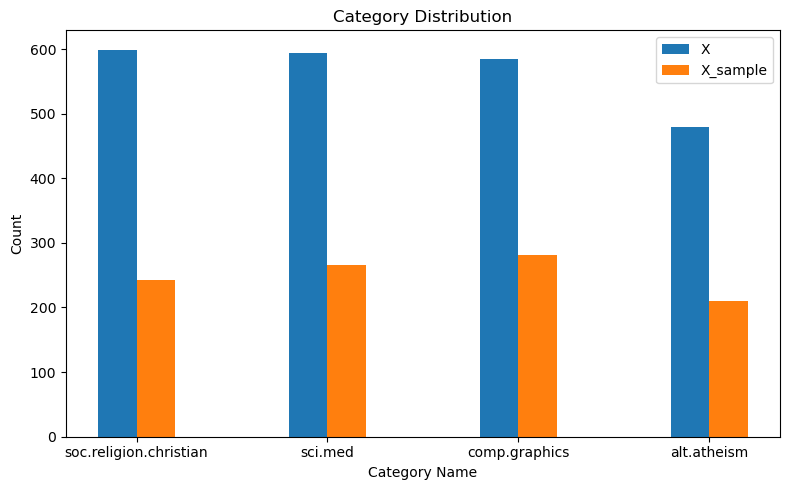

In [26]:
# Answer here
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
x_counts = X['category_name'].value_counts()
x_sample_counts = X_sample['category_name'].value_counts().reindex(x_counts.index, fill_value=0)

# Create a figure and plot bars
fig, ax = plt.subplots(figsize=(8, 5))
bar_width = 0.2
index = np.arange(len(x_counts))

# Plotting both barcharts
ax.bar(index, x_counts, bar_width, label='X')
ax.bar(index + bar_width, x_sample_counts, bar_width, label='X_sample')

# Labels and title
ax.set(xlabel='Category Name', ylabel='Count', title='Category Distribution')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(x_counts.index)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

---

In [28]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix
print(X_counts[0])

  (0, 14887)	1
  (0, 29022)	1
  (0, 8696)	4
  (0, 4017)	2
  (0, 33256)	2
  (0, 21661)	3
  (0, 9031)	3
  (0, 31077)	1
  (0, 9805)	2
  (0, 17366)	1
  (0, 32493)	4
  (0, 16916)	2
  (0, 19780)	2
  (0, 17302)	2
  (0, 23122)	1
  (0, 25663)	1
  (0, 16881)	1
  (0, 16082)	1
  (0, 23915)	1
  (0, 32142)	5
  (0, 33597)	2
  (0, 20253)	1
  (0, 587)	1
  (0, 12051)	1
  (0, 5201)	1
  :	:
  (0, 25361)	1
  (0, 25337)	1
  (0, 12833)	2
  (0, 5195)	1
  (0, 27836)	1
  (0, 18474)	1
  (0, 32270)	1
  (0, 9932)	1
  (0, 15837)	1
  (0, 32135)	1
  (0, 17556)	1
  (0, 4378)	1
  (0, 26175)	1
  (0, 9338)	1
  (0, 33572)	1
  (0, 31915)	1
  (0, 177)	2
  (0, 2326)	2
  (0, 3062)	1
  (0, 35416)	1
  (0, 20459)	1
  (0, 14085)	1
  (0, 3166)	1
  (0, 12541)	1
  (0, 230)	1


### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [30]:
# Answer here

# Initialize variable to store index
next_one_index = None

dense_matrix = X_counts.toarray()

# Loop through the fifth record
for idx in range(1, dense_matrix[4].shape[0]):
    if dense_matrix[4][idx] == 1:
        next_one_index = idx
        break

if next_one_index is not None:
    # Get the word corresponding to the next '1'
    word = count_vect.get_feature_names_out()[next_one_index]
    print(f"The next '1' after the first element in the fifth record is at index {next_one_index}, corresponding to the word: '{word}'")
else:
    None

The next '1' after the first element in the fifth record is at index 37, corresponding to the word: '01'


---

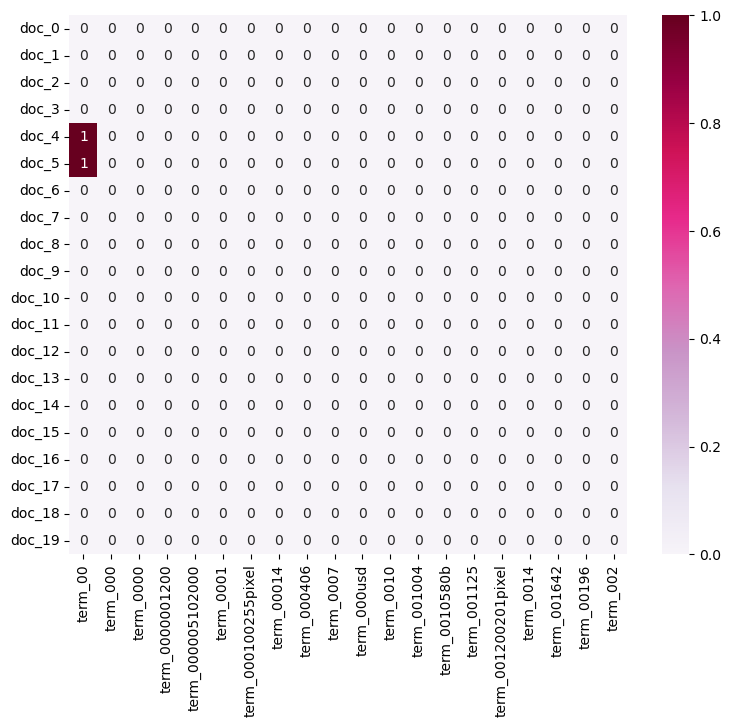

In [32]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]
plot_z = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

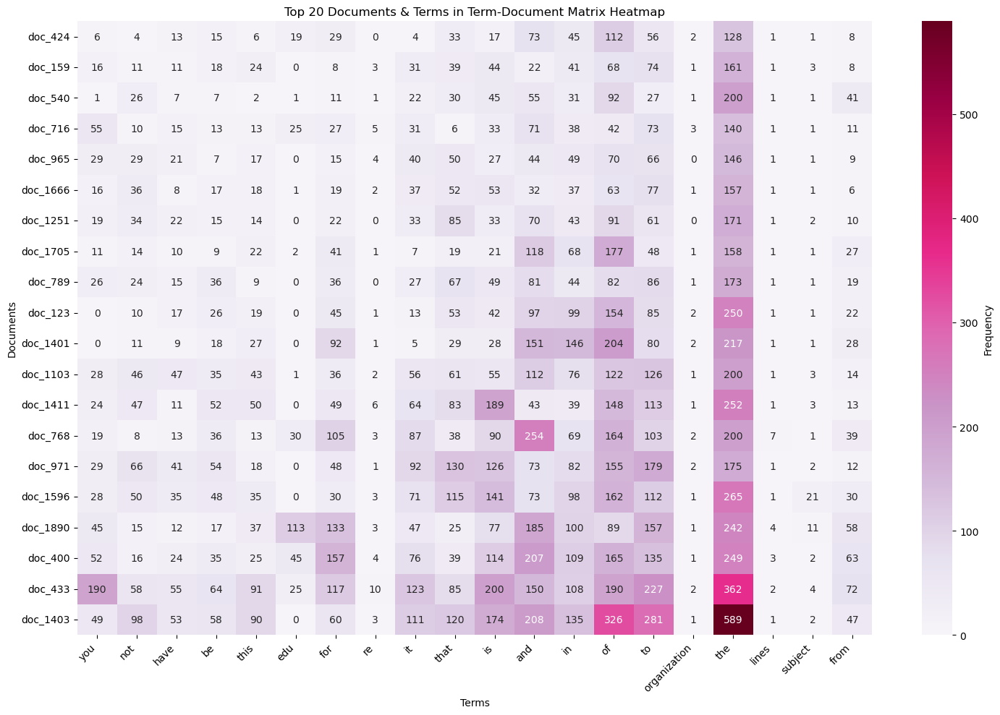

In [34]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming X_counts is your original sparse term-document matrix
# Filter out terms that are too infrequent (e.g., appearing in less than 5 documents)
term_frequency = np.sum(X_counts.toarray() > 0, axis=0)  
high_freq_terms = np.where(term_frequency >= 5)[0]  # Indices of high-frequency terms

# Get the frequencies of the high-frequency terms
filtered_term_frequencies = term_frequency[high_freq_terms]

# Get the indices of the top 20 terms based on their frequency
top_20_term_indices = np.argsort(filtered_term_frequencies)[-20:]  # Get indices of the top 20 terms
top_20_terms = high_freq_terms[top_20_term_indices]  # Actual term indices

# Create a filtered sparse matrix for the selected top 20 terms
X_counts_top_terms = X_counts[:, top_20_terms]  # Use NumPy-style indexing

# Calculate the sum of frequencies for each document for the top terms
document_frequencies = np.sum(X_counts_top_terms.toarray(), axis=1)

# Get the indices of the top 20 documents based on their total frequencies
top_20_doc_indices = np.argsort(document_frequencies)[-20:]  # Get indices of the top 20 documents

# Create a filtered sparse matrix for the top 20 documents and top 20 terms
X_counts_top_20 = X_counts_top_terms[top_20_doc_indices, :]  

# Convert to dense format for plotting
X_counts_top_20_dense = X_counts_top_20.toarray()

# Create a DataFrame for the heatmap
df_top_20 = pd.DataFrame(X_counts_top_20_dense, 
                         columns=[count_vect.get_feature_names_out()[i] for i in top_20_terms], 
                         index=[f'doc_{i}' for i in top_20_doc_indices])

# Step 7: Plot the filtered heatmap for the top 20 documents and top 20 terms
plt.subplots(figsize=(15, 10))
ax = sns.heatmap(df_top_20, cmap="PuRd", annot=True, fmt='g', cbar_kws={'label': 'Frequency'})
plt.title('Top 20 Documents & Terms in Term-Document Matrix Heatmap')
plt.xlabel('Terms')
plt.ylabel('Documents')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

---

### >>> **Exercise 12 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

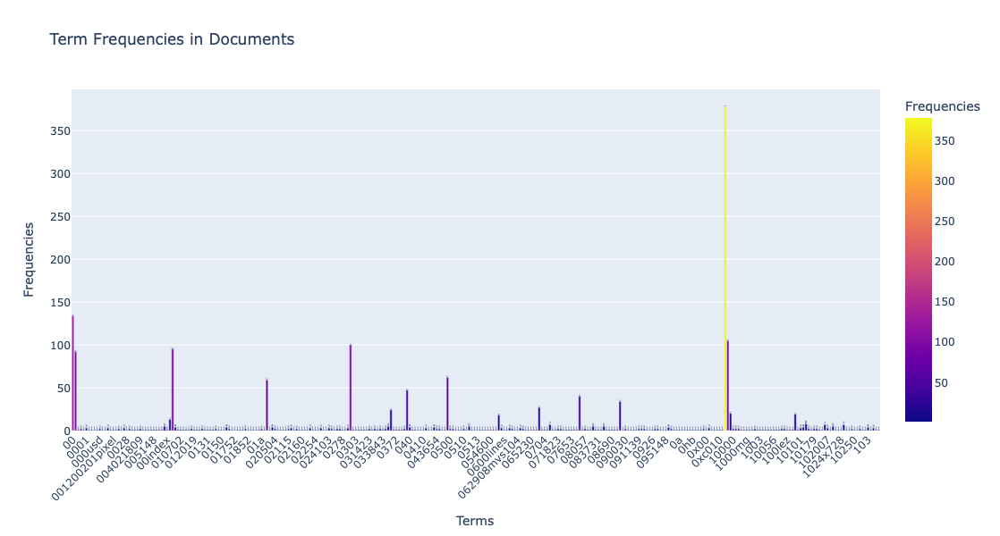

In [37]:
# Answer here
import plotly.express as px

# Data
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
terms = count_vect.get_feature_names_out()[:300]  # Get the first 300 terms
frequencies = term_frequencies[:300]  # Corresponding frequencies

# Create a DataFrame for Plotly
df_frequencies = pd.DataFrame({
    'Terms': terms,
    'Frequencies': frequencies
})

# Plot Bar
fig = px.bar(df_frequencies, 
             x='Terms', 
             y='Frequencies', 
             title='Term Frequencies in Documents',
             labels={'Terms': 'Terms', 'Frequencies': 'Frequencies'},
             color='Frequencies', 
             hover_data=['Terms'],  
             text='Frequencies')  

# Format
fig.update_layout(xaxis_tickangle=-45,  
                  height=600,  
                  showlegend=False) 

# Show the figure
fig.show() 

---

### >>> **Exercise 13 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


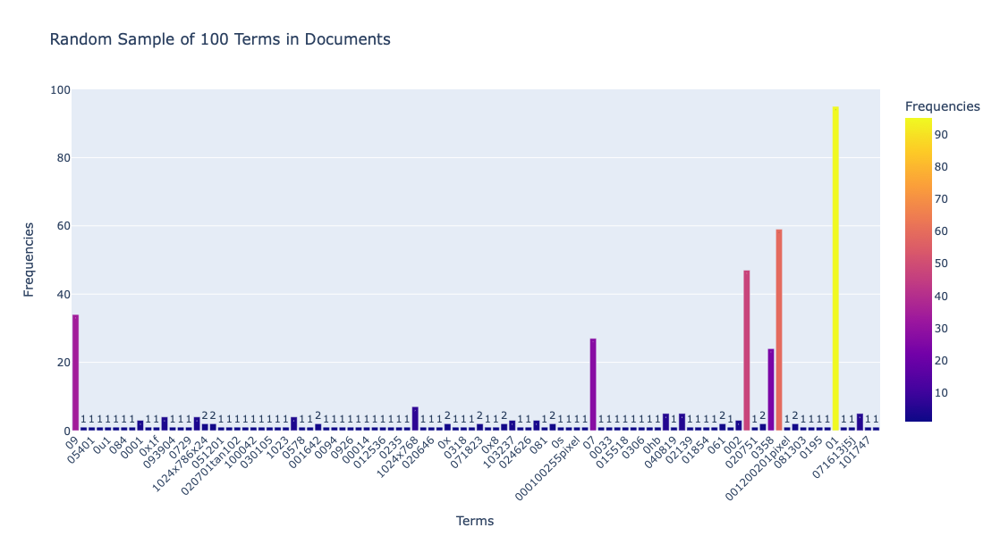

In [40]:
# Answer here
import pandas as pd
import numpy as np
import plotly.express as px

sample_size = 100  

# Randomly sample 
df_sample = df_frequencies.sample(n=sample_size, random_state=42)  # Random state for reproducibility

# Plot bar
fig_sample = px.bar(df_sample,
                    x='Terms',
                    y='Frequencies',
                    title=f'Random Sample of {sample_size} Terms in Documents',
                    labels={'Terms': 'Terms', 'Frequencies': 'Frequencies'},
                    color='Frequencies',
                    hover_data=['Terms'],
                    text='Frequencies')

# Format
fig_sample.update_layout(xaxis_tickangle=-45,
                         height=600,
                         showlegend=False)

# Show the figure
fig_sample.show()

---

### >>> **Exercise 14 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

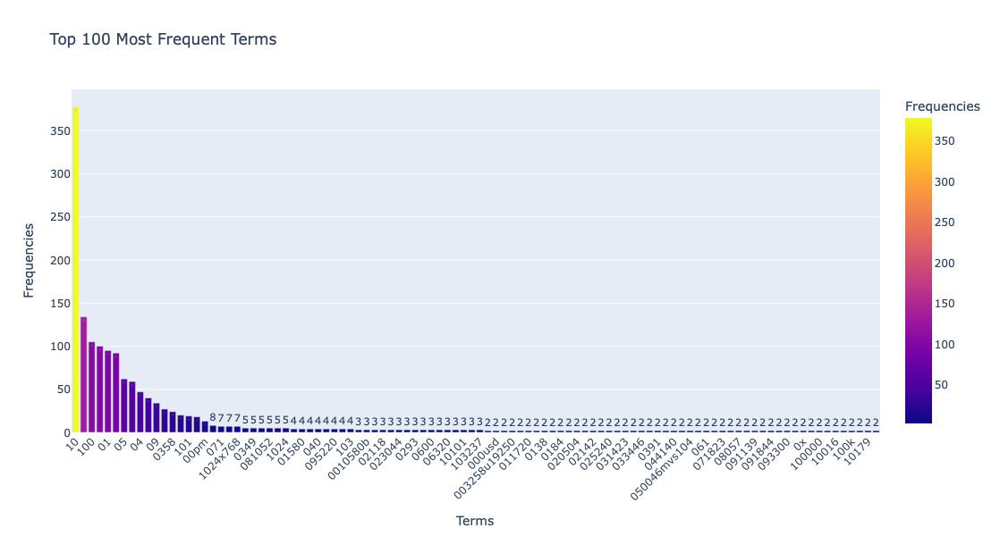

In [43]:
# Answer here

# Set the number of top terms to visualize
top_n = 100  # Only include the top 100 terms

# Sort the DataFrame by frequency and select the top N
df_frequencies_top = df_frequencies.nlargest(top_n, 'Frequencies')

# Plot the top N terms
fig_top = px.bar(df_frequencies_top,
                 x='Terms',
                 y='Frequencies',
                 title=f'Top {top_n} Most Frequent Terms',
                 labels={'Terms': 'Terms', 'Frequencies': 'Frequencies'},
                 color='Frequencies',
                 hover_data=['Terms'],
                 text='Frequencies')

# Format
fig_top.update_layout(xaxis_tickangle=-45,
                      height=600,
                      showlegend=False)

# Show the figure
fig_top.show()

---

### >>> **Exercise 15 (take home):** 
You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

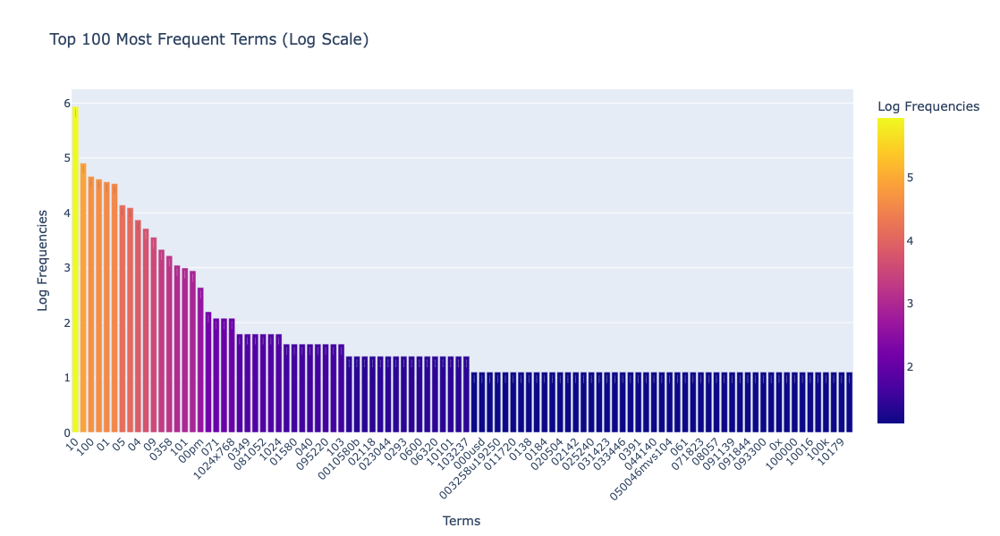

In [46]:
import numpy as np
import pandas as pd
import plotly.express as px

# Data
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
terms = count_vect.get_feature_names_out()[:300]  # Get the first 300 terms

# Log-transform the term frequencies
term_frequencies_log = np.log1p(term_frequencies[:300])  # Log-transformed frequencies

# Create a DataFrame for Plotly with logarithmic frequencies
df_frequencies_log = pd.DataFrame({
    'Terms': terms,
    'Frequencies': term_frequencies_log  # Use log-transformed frequencies
})

# Set the number of top terms to visualize
top_n = 100  # Only include the top 100 terms

# Sort the DataFrame by frequency and select the top N
df_frequencies_log_top = df_frequencies_log.nlargest(top_n, 'Frequencies')

# Plot the top N terms using logarithmic frequencies
fig_log = px.bar(df_frequencies_log_top,
                 x='Terms',
                 y='Frequencies',
                 title=f'Top {top_n} Most Frequent Terms (Log Scale)',
                 labels={'Terms': 'Terms', 'Frequencies': 'Log Frequencies'},
                 color='Frequencies',
                 hover_data=['Terms'],
                 text='Frequencies')

# Format
fig_log.update_layout(xaxis_tickangle=-45,
                      height=600,
                      showlegend=False)

# Show the figure
fig_log.show()

---

In [48]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['category_name'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['text'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [49]:
category_number=0 #You can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]




For category comp.graphics we filter the following words:
Bottom 1.0% words: 
initworld    1
jkpg         1
jiu1         1
jiu          1
jfreund      1
            ..
lab2         1
laaksone     1
l4v          1
l300         1
l14h11       1
Length: 137, dtype: int64
Top 5.0% words: 
40               27
distributed      27
open             27
multi            27
getting          27
               ... 
is             1751
and            2382
of             2470
to             2775
the            4537
Length: 687, dtype: int64

For category soc.religion.christian we filter the following words:
Bottom 1.0% words: 
disparate       1
expose          1
explosive       1
resisting       1
exploitation    1
               ..
fence           1
feminist        1
remarriage      1
remarried       1
remeber         1
Length: 138, dtype: int64
Top 5.0% words: 
pagan        36
claims       36
gave         36
parts        36
jr           37
          ...  
that       4393
and        4409
to        

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### >>> **Exercise 16 (take home):** 
Review the words that were filtered in each category and comment about the differences and similarities that you can see.

---

In [52]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.10773515701293945


In [53]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 0.15248703956604004


In [54]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.058818817138671875


In [55]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.17563986778259277


In [56]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

                        Patterns  Support
19911                        gov       33
19912                  institute       33
57158                    snm6394       32
19910                       form       31
57156                    deleted       30
...                          ...      ...
54045  axes funds motss matching        9
54044   boy funds motss matching        9
54043    boy axes motss matching        9
54042    et funds motss matching        9
0                          swell        9

[57159 rows x 2 columns]
Number of patterns discarded: 2304


In [57]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2254,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2255,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [58]:
#from PAMI.extras.DF2DB import DenseFormatDF as db      #Uncomment this line and comment the line below if this block of code 
                                                        #gives you trouble
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    #obj = db.DenseFormatDF(term_document_dfs[category]) #Uncomment this line and comment the line below if this block of code 
                                                         #gives you trouble
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)


### >>> **Exercise 17 (take home):** 
Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance. For this you can find the following google collabs for reference provided by their github repository here: [FAE Top-K](https://colab.research.google.com/github/UdayLab/PAMI/blob/main/notebooks/frequentPattern/topk/FAE.ipynb) and [MaxFPGrowth](https://colab.research.google.com/github/UdayLab/PAMI/blob/main/notebooks/frequentPattern/maximal/MaxFPGrowth.ipynb)

In [60]:
# Answer Here

# FAE Top-K
from PAMI.frequentPattern.topk import FAE as alg
import pandas as pd

# Parameters
inputFile = 'td_freq_db_comp_graphics.csv'
separator = '\t'
k_values = [500, 1000, 1500]

# Initialize a DataFrame to store the results of the FAE algorithm
result_fae = pd.DataFrame(columns=['algorithm', 'k', 'patterns', 'runtime', 'memory'])

# Specify the algorithm name
algorithm = 'FAE'
for k in k_values:
    obj = alg.FAE(inputFile, k=k, sep=separator)
    obj.mine()
    # Store the results in the DataFrame
    result_fae.loc[result_fae.shape[0]] = [algorithm, k, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]

print("\nFAE Top-K Results:")
print(result_fae)

 TopK frequent patterns were successfully generated using FAE algorithm.
 TopK frequent patterns were successfully generated using FAE algorithm.
 TopK frequent patterns were successfully generated using FAE algorithm.

FAE Top-K Results:
  algorithm     k  patterns   runtime     memory
0       FAE   500       500  0.534378  216825856
1       FAE  1000      1000  1.440797  461176832
2       FAE  1500      1500  2.622815  455442432


In [61]:
# MaxFPGrowth
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg
import pandas as pd

#Specify the input parameters
inputFile = 'td_freq_db_comp_graphics.csv'
seperator='\t'
min_supports = [3, 6, 9]

#initialize a data frame to store the results of MaxFPGrowth algorithm
result = pd.DataFrame(columns=['algorithm', 'minSup', 'patterns', 'runtime', 'memory'])

for min_sup in min_supports:
    obj = alg.MaxFPGrowth(inputFile, minSup=min_sup, sep=seperator)
    obj.mine()
    #store the results in the data frame
    result.loc[result.shape[0]] = ['MaxFPGrowth', min_sup, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]
    
print("\nMaxFPGrowth Results:")
print(result)

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 

MaxFPGrowth Results:
     algorithm  minSup  patterns   runtime     memory
0  MaxFPGrowth       3      6872  8.689596  455655424
1  MaxFPGrowth       6      1340  0.106508  456130560
2  MaxFPGrowth       9       660  0.043575  456310784


---

### >>> Exercise 18 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

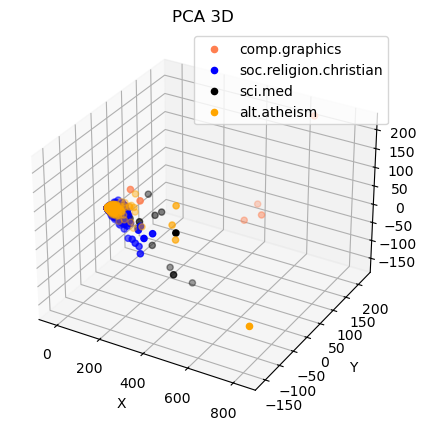

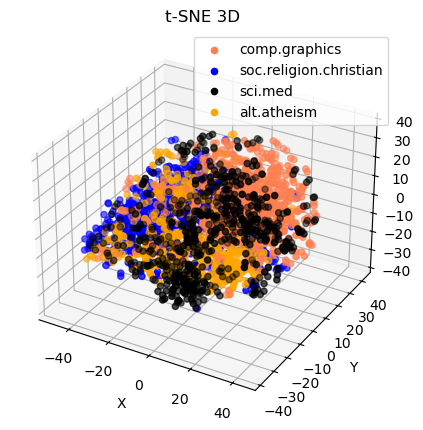

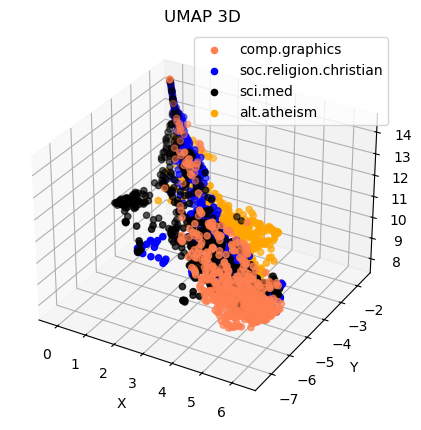

In [64]:
# Answer here
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Applying dimensionality reduction to 3D
X_pca_tdm_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_3d = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

# Define colors and categories
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

# Function to create 3D scatter plot
def plot_3d_scatter(X_reduced, title): 
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        zs = X_reduced[X['category_name'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    plt.show()

# Create 3D scatter plots
plot_3d_scatter(X_pca_tdm_3d, 'PCA 3D')
plot_3d_scatter(X_tsne_tdm_3d, 't-SNE 3D')
plot_3d_scatter(X_umap_tdm_3d, 'UMAP 3D')

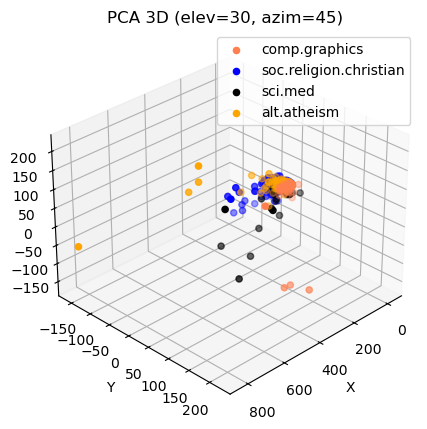

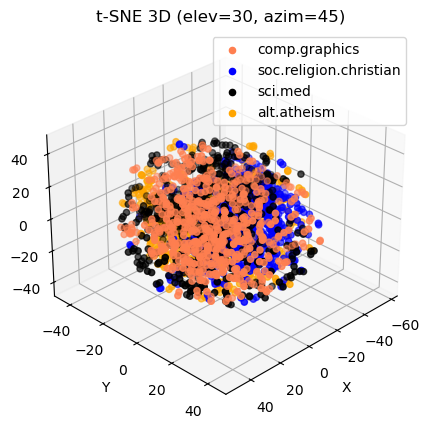

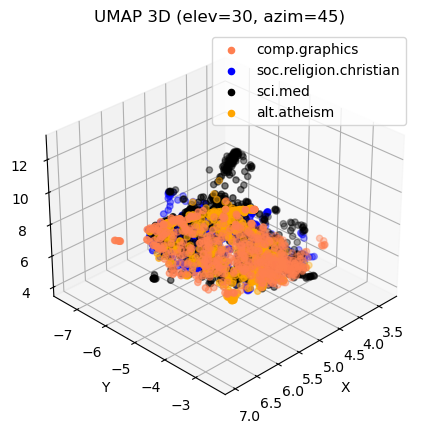

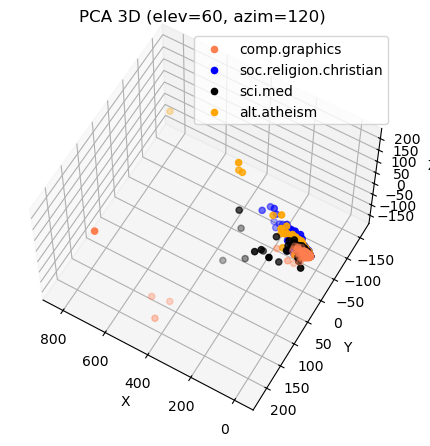

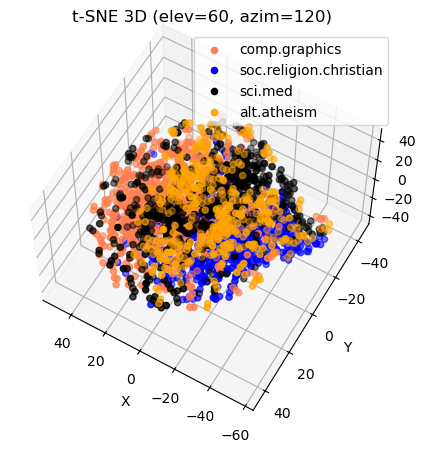

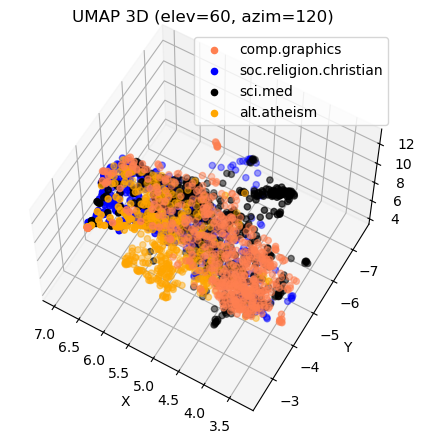

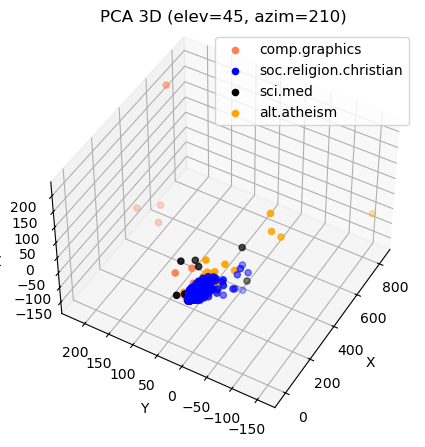

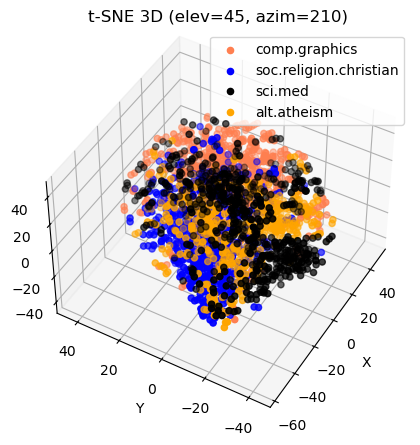

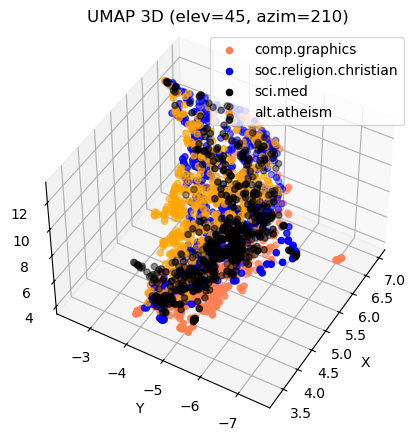

In [65]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Applying dimensionality reduction to 3D
X_pca_tdm_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_3d = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

# Define colors and categories
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

# Function to create 3D scatter plot with adjustable camera angle
def plot_3d_scatter(X_reduced, title, elev=30, azim=45): 
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        zs = X_reduced[X['category_name'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    
    # Adjust camera angle
    ax.view_init(elev=elev, azim=azim)
    
    plt.show()

# Create 3D scatter plots from different angles
angles = [(30, 45), (60, 120), (45, 210)]  # Different viewing angles (elev, azim)

for elev, azim in angles:
    plot_3d_scatter(X_pca_tdm_3d, f'PCA 3D (elev={elev}, azim={azim})', elev=elev, azim=azim)
    plot_3d_scatter(X_tsne_tdm_3d, f't-SNE 3D (elev={elev}, azim={azim})', elev=elev, azim=azim)
    plot_3d_scatter(X_umap_tdm_3d, f'UMAP 3D (elev={elev}, azim={azim})', elev=elev, azim=azim)

---

In [67]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category)
X['bin_category'] = mlb.transform(X['category']).tolist()
X[0:9]

,text,category,category_name,tokenized_text,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"{also, Computer, way, Subject:, of, convert, g...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"{whole, domain, cells., Subject:, of, it, My, ...","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"{working, still, also, trying, bytes, Subject:...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"{Letteren,, german, (M.M., french)., From:, at...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"{at, Elder, writes:, Subject:, equalivant, you...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"{at, >The, turn, well., all., step, further., ...","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"{at, acts, step, write, remainder, >not, >Joe,...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"{treatment., cost, cause, also, Churchill), wr...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,{<werner-240393161954@tol7mac15.soe.berkeley.e...,"[0, 0, 1, 0]"


### >>> **Exercise 19 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [69]:
# Answer here
mlb = preprocessing.LabelBinarizer()

# Fit the LabelBinarizer on the 'category_name' column
mlb.fit(X['category_name'])

LabelBinarizer()

In [70]:
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()

In [71]:
X[0:9]

,text,category,category_name,tokenized_text,bin_category,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"{also, Computer, way, Subject:, of, convert, g...","[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"{whole, domain, cells., Subject:, of, it, My, ...","[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"{working, still, also, trying, bytes, Subject:...","[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"{Letteren,, german, (M.M., french)., From:, at...","[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"{at, Elder, writes:, Subject:, equalivant, you...","[0, 0, 0, 1]","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"{at, >The, turn, well., all., step, further., ...","[0, 0, 0, 1]","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"{at, acts, step, write, remainder, >not, >Joe,...","[0, 0, 0, 1]","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"{treatment., cost, cause, also, Churchill), wr...","[0, 0, 1, 0]","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,{<werner-240393161954@tol7mac15.soe.berkeley.e...,"[0, 0, 1, 0]","[0, 0, 1, 0]"


---

### Homework Begins Here

## Table of Contents
1. Data Source
2. Data Preparation
3. Data Transformation
 - 3.1 Converting Dictionary into Pandas dataframe
 - 3.2 Familiarizing yourself with the Data
4. Data Mining using Pandas
 - 4.1 Dealing with Missing Values
 - 4.2 Dealing with Duplicate Data
5. Data Preprocessing
 - 5.1 Sampling
 - 5.2 Feature Creation
 - 5.3 Feature Subset Selection
 - 5.4 Atrribute Transformation / Aggregation
 - 5.5 Dimensionality Reduction
 - 5.6 Discretization and Binarization
6. Data Exploration
7. Data Classification

## 1. The Data

In [76]:
import pandas as pd

# Load Data
df = pd.read_csv('Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv')

## 2. Data Preparation

Let's take a look at some of the records that are contained in the subset of the data

In [79]:
# Display the first 5 rows
df.head(5)

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...


In [80]:
# Another method of displaying (in Lab 1 - Master)
df[0:5]

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...


In [81]:
# Assigning the sentiment categories
categories = df['sentiment'].unique()  # Check what unique categories are present
print(categories)

['not nostalgia' 'nostalgia']


In [82]:
# Get a summary of the DataFrame
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  1500 non-null   object
 1   comment    1500 non-null   object
dtypes: object(2)
memory usage: 23.6+ KB
None


In [83]:
len(df)

1500

#### We can also print some examples from the subset

In [85]:
# Splitting it by every sentence
print("\n".join(sentence + '.' for sentence in df['comment'][0].split(". ") if sentence))

He was a singer with a golden voice that I love to hear all the time.
I was his great fan at the age of 16years in those days and still now.
Although we have many singers now, but, I can vouch for Jim Reeves all the time.
You feel relaxed, emotional and loving.
Thank you Lord for his life..


In [86]:
# Print the sentiment categories for the first 10 comments
for sentiment in df['sentiment'][:10]:
    print(sentiment)

not nostalgia
nostalgia
nostalgia
not nostalgia
nostalgia
nostalgia
nostalgia
nostalgia
not nostalgia
not nostalgia


Print out the text data for the first three samples in the dataset

In [88]:
for i in range(3):
    print(f"Comment: {df['comment'][i]}")
    print(f"Sentiment: {df['sentiment'][i]}")
    print()

Comment: He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.
Sentiment: not nostalgia

Comment: The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel
Sentiment: nostalgia

Comment: I have most of Mr. Reeves songs.  Always love his smooth voice, so comforting and sounds like the people I grew up around.  They were so gentle and sweet, but I had to leave my little town to find a job at age 17.  I graduated early.  I never forgot how great it was to grow up with simple people who had no pretensions -- just loving and gentle, like I think Jesus is.
Sentiment: nostalgia



## 3. Data Transformation

### 3.1 Converting Dictionary into Pandas Dataframe

In [91]:
import pandas as pd

# Import your functions
import helpershw.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame(dmh.format_rows(df['comment']), columns=['comment'])


In [92]:
X[0:2]

,comment
0,He was a singer with a golden voice that I lov...
1,The mist beautiful voice ever I listened to hi...


In [93]:
for t in X['comment'][:2]:
    print(t)

He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.
The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel


### Adding Columns

In [95]:
# add category to the dataframe
X['sentiment'] = df.sentiment

In [96]:
X[0:10]

,comment,sentiment
0,He was a singer with a golden voice that I lov...,not nostalgia
1,The mist beautiful voice ever I listened to hi...,nostalgia
2,I have most of Mr. Reeves songs. Always love ...,nostalgia
3,30 day leave from 1st tour in Viet Nam to conv...,not nostalgia
4,listening to his songs reminds me of my mum wh...,nostalgia
5,"Every time I heard this song as a child, I use...",nostalgia
6,"My dad loved listening to Jim Reeves, when I w...",nostalgia
7,i HAVE ALSO LISTENED TO Jim Reeves since child...,nostalgia
8,Wherever you are you always in my heart,not nostalgia
9,Elvis will always be number one no one can com...,not nostalgia


#### Let's query the last 10 records

In [98]:
X[-10:]

,comment,sentiment
1490,"He really isn't my cup of tea, but some of his...",not nostalgia
1491,real music...how i miss those days...brings ba...,nostalgia
1492,i used to cry over this song cause i had a boy...,nostalgia
1493,"He really has that ""love you like a brother"" l...",not nostalgia
1494,That's funny. But Leo really is a nice guy. He...,not nostalgia
1495,"i don't know!..but the opening of the video,.....",not nostalgia
1496,it's sad this is such a beautiful song when yo...,not nostalgia
1497,"Dear Friend, I think age and time is not that ...",not nostalgia
1498,I was born in 1954 and started to be aware of ...,nostalgia
1499,This is the first CD I bought after my marriag...,nostalgia


#### Let's query the first 10 records - 3 methods

In [100]:
# using loc (by label)
X.loc[:10, 'comment']

0     He was a singer with a golden voice that I lov...
1     The mist beautiful voice ever I listened to hi...
2     I have most of Mr. Reeves songs.  Always love ...
3     30 day leave from 1st tour in Viet Nam to conv...
4     listening to his songs reminds me of my mum wh...
5     Every time I heard this song as a child, I use...
6     My dad loved listening to Jim Reeves, when I w...
7     i HAVE ALSO LISTENED TO Jim Reeves since child...
8              Wherever you  are you always in my heart
9     Elvis will always be number one no one can com...
10    ill bet if they begin to play this song on the...
Name: comment, dtype: object

In [101]:
# using iloc (by position)
X.iloc[:10, 0]

0    He was a singer with a golden voice that I lov...
1    The mist beautiful voice ever I listened to hi...
2    I have most of Mr. Reeves songs.  Always love ...
3    30 day leave from 1st tour in Viet Nam to conv...
4    listening to his songs reminds me of my mum wh...
5    Every time I heard this song as a child, I use...
6    My dad loved listening to Jim Reeves, when I w...
7    i HAVE ALSO LISTENED TO Jim Reeves since child...
8             Wherever you  are you always in my heart
9    Elvis will always be number one no one can com...
Name: comment, dtype: object

In [102]:
# using tail
X.comment.head(10)

0    He was a singer with a golden voice that I lov...
1    The mist beautiful voice ever I listened to hi...
2    I have most of Mr. Reeves songs.  Always love ...
3    30 day leave from 1st tour in Viet Nam to conv...
4    listening to his songs reminds me of my mum wh...
5    Every time I heard this song as a child, I use...
6    My dad loved listening to Jim Reeves, when I w...
7    i HAVE ALSO LISTENED TO Jim Reeves since child...
8             Wherever you  are you always in my heart
9    Elvis will always be number one no one can com...
Name: comment, dtype: object

### Try to fetch records belonging to the nostalgia category, and query every 10th record. Only show the first 5 records.

In [104]:
# Fetch records belonging to the 'nostalgia' category and query every 10th record
nostalgia_records = X[X['sentiment']=='nostalgia'].iloc[::10]
print(nostalgia_records)

# Show the first 5 records of the result
nostalgia_records.head(5)

                                                comment  sentiment
1     The mist beautiful voice ever I listened to hi...  nostalgia
18    My Grandparents had a pub in the 1970's, this ...  nostalgia
32    I remember my Mom listening to Jim over and ov...  nostalgia
50    If I remember correctly, this song came out af...  nostalgia
71    Gosh does this bring back memories. Nearly eve...  nostalgia
...                                                 ...        ...
1406  The skating rink! Ah... Good times! Brings bac...  nostalgia
1423  I love you more than I can say. It's the words...  nostalgia
1439  January 2019...I remember sitting in the back ...  nostalgia
1456  Brings sweet memories to  mind. Warms my heart...  nostalgia
1478         love this song bring back good memories...  nostalgia

[75 rows x 2 columns]


,comment,sentiment
1,The mist beautiful voice ever I listened to hi...,nostalgia
18,"My Grandparents had a pub in the 1970's, this ...",nostalgia
32,I remember my Mom listening to Jim over and ov...,nostalgia
50,"If I remember correctly, this song came out af...",nostalgia
71,Gosh does this bring back memories. Nearly eve...,nostalgia


## 4. Data Mining using Pandas

### 4.1 Missing Values

In [107]:
# check missing values
X.isnull()

# True in this case means that the data is missing and False means that the data is present.

,comment,sentiment
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
1495,False,False
1496,False,False
1497,False,False
1498,False,False


In [108]:
# Calculate missing values by columns
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,comment,sentiment
0,The amount of missing records is:,The amount of missing records is:
1,0,0


In [109]:
# Calculate missing values in every record
X.isnull().apply(lambda x: dmh.check_missing_values(x), axis=1)

0       (The amount of missing records is: , 0)
1       (The amount of missing records is: , 0)
2       (The amount of missing records is: , 0)
3       (The amount of missing records is: , 0)
4       (The amount of missing records is: , 0)
                         ...                   
1495    (The amount of missing records is: , 0)
1496    (The amount of missing records is: , 0)
1497    (The amount of missing records is: , 0)
1498    (The amount of missing records is: , 0)
1499    (The amount of missing records is: , 0)
Length: 1500, dtype: object

There are 0 missing data in this dataset.

We are now inserting some dummy data into the dataframe and test the reliability of the functions.

In [112]:
dummy_series = pd.Series(["dummy_record", None], index=["comment", "sentiment"])
dummy_series

comment      dummy_record
sentiment            None
dtype: object

In [113]:
dummy_series.to_frame().T
# .to_frame() -> Convert Series to DataFrame
# .T          -> Transpose

,comment,sentiment
0,dummy_record,None


In [114]:
result_with_series = pd.concat([X, dummy_series.to_frame().T], ignore_index=True)

In [115]:
# check if the records was commited into result
len(result_with_series)

1501

In [116]:
# detect missing value
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))

,comment,sentiment
0,The amount of missing records is:,The amount of missing records is:
1,0,1


Missing value comes from the sentiment attribute. 

Now we are inserting the dummy record to the original X dataframe instead (another method) since there are many ways to conduct specific operations on the dataframes.

In [118]:
# dummy record as dictionary format
dummy_dict = [{'comment': 'dummy_record'
              }]

In [119]:
X = pd.concat([X, pd.DataFrame(dummy_dict)], ignore_index=True)

In [120]:
len(X)

1501

In [121]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,comment,sentiment
0,The amount of missing records is:,The amount of missing records is:
1,0,1


So now that we can see that our data has missing values, we want to remove the records with missing values. The code to drop the record with missing that we just added, is the following:

In [123]:
X.dropna(inplace=True)

In [124]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,comment,sentiment
0,The amount of missing records is:,The amount of missing records is:
1,0,0


In [125]:
len(X)

1500

### 4.2 Dealing with Duplicate Data

In [127]:
X.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool

In [128]:
# check the sum of duplicate records 
sum(X.duplicated())

1

In [129]:
# check for duplicates by only checking the text attribute
sum(X.duplicated('comment'))

1

In [130]:
# Find all rows where the 'comment' is duplicated
duplicates = X[X.duplicated('comment', keep=False)]

# Extract and display the unique duplicated comments
duplicated_comments = duplicates['comment'].unique()

# Print the duplicated comments
print("Duplicated comments:")
for comment in duplicated_comments:
    print(comment)

Duplicated comments:
never heard this song before... WOW What an amazing rhythm, what a voice???


In [131]:
# Keeps first duplicate and remove the second one (Keep only one)
X.drop_duplicates(keep='first', inplace=True) # inplace applies changes directly on our dataframe

In [132]:
# double-check the duplicate records 
sum(X.duplicated())

0

In [133]:
len(X)

1499

## 5.  Data Preprocessing

### 5.1 Sampling

In [136]:
X_sample = X.sample(n=800) #random state

In [137]:
len(X_sample)

800

In [138]:
X_sample[0:4]

,comment,sentiment
1204,"Popular, lot of air play the summer before my ...",nostalgia
936,This is timeless music!! No matter what music ...,not nostalgia
63,This song always reminds me of the genesis of ...,nostalgia
397,Long-time ago. My dad: This song is about a gu...,nostalgia


Distribution of categories in both the sample and original dataset.

In [140]:
import matplotlib.pyplot as plt
%matplotlib inline

In [141]:
# categories
print(categories)

['not nostalgia' 'nostalgia']


sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64


<Axes: title={'center': 'Sentiment distribution'}, xlabel='sentiment'>

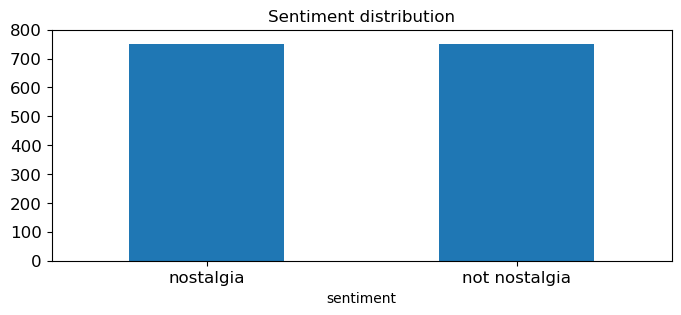

In [142]:
# plot barchart for X
upper_bound = max(X.sentiment.value_counts() + 50)
print(X.sentiment.value_counts())
plt.style.use("default")
#plot barchart for X_sample
X.sentiment.value_counts().plot(kind = 'bar',
                                           title = 'Sentiment distribution',
                                           ylim = [0, upper_bound],
                                           rot = 0, fontsize = 12, figsize = (8,3))

sentiment
not nostalgia    407
nostalgia        393
Name: count, dtype: int64


<Axes: title={'center': 'Sentiment distribution'}, xlabel='sentiment'>

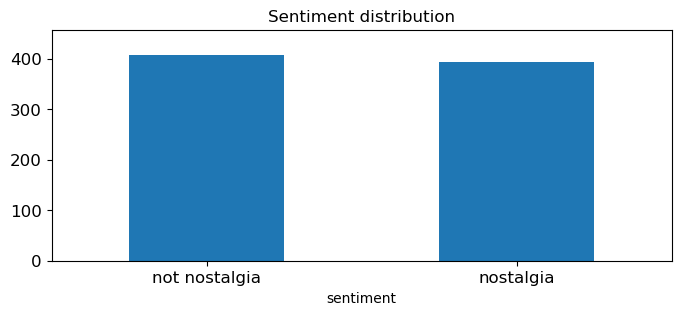

In [143]:
# plot barchart for X_sample
upper_bound = max(X_sample.sentiment.value_counts() + 50)
print(X_sample.sentiment.value_counts())
plt.style.use("default")
#plot barchart for X_sample
X_sample.sentiment.value_counts().plot(kind = 'bar',
                                           title = 'Sentiment distribution',
                                           ylim = [0, upper_bound],
                                           rot = 0, fontsize = 12, figsize = (8,3))

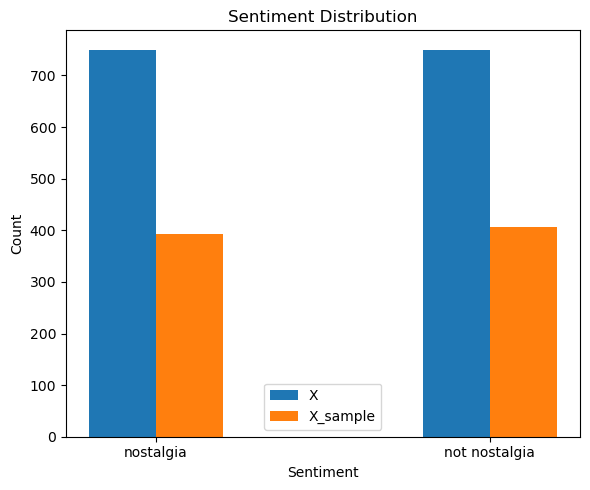

In [144]:
# Side by Side comparison
import numpy as np
x_counts = X['sentiment'].value_counts()
x_sample_counts = X_sample['sentiment'].value_counts().reindex(x_counts.index, fill_value=0)

# Create a figure and plot bars
fig, ax = plt.subplots(figsize=(6, 5))
bar_width = 0.2
index = np.arange(len(x_counts))

# Plotting both barcharts
ax.bar(index, x_counts, bar_width, label='X')
ax.bar(index + bar_width, x_sample_counts, bar_width, label='X_sample')

# Labels and title
ax.set(xlabel='Sentiment', ylabel='Count', title='Sentiment Distribution')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(x_counts.index)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

For both datasets, the distribution of the categories remain relatively the same. Thus when conducting sampling on the dataset, we will still obtain a representative enough dataset. 

### 5.2 Feature Creation

In [147]:
import nltk

In [148]:
X['unigrams'] = X['comment'].apply(lambda x: dmh.tokenize_text(x))

In [149]:
# unigrams contains an array of tokens, which were extracted from the original text field
X[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [150]:
X[0:4]

,comment,sentiment,unigrams
0,He was a singer with a golden voice that I lov...,not nostalgia,"[He, was, a, singer, with, a, golden, voice, t..."
1,The mist beautiful voice ever I listened to hi...,nostalgia,"[The, mist, beautiful, voice, ever, I, listene..."
2,I have most of Mr. Reeves songs. Always love ...,nostalgia,"[I, have, most, of, Mr., Reeves, songs, ., Alw..."
3,30 day leave from 1st tour in Viet Nam to conv...,not nostalgia,"[30, day, leave, from, 1st, tour, in, Viet, Na..."


In [151]:
list(X[0:1]['unigrams'])

[['He',
  'was',
  'a',
  'singer',
  'with',
  'a',
  'golden',
  'voice',
  'that',
  'I',
  'love',
  'to',
  'hear',
  'all',
  'the',
  'time',
  '.',
  'I',
  'was',
  'his',
  'great',
  'fan',
  'at',
  'the',
  'age',
  'of',
  '16years',
  'in',
  'those',
  'days',
  'and',
  'still',
  'now',
  '.',
  'Although',
  'we',
  'have',
  'many',
  'singers',
  'now',
  ',',
  'but',
  ',',
  'I',
  'can',
  'vouch',
  'for',
  'Jim',
  'Reeves',
  'all',
  'the',
  'time',
  '.',
  'You',
  'feel',
  'relaxed',
  ',',
  'emotional',
  'and',
  'loving',
  '.',
  'Thank',
  'you',
  'Lord',
  'for',
  'his',
  'life',
  '.']]

### 5.3 Feature subset selection

In [153]:
# document-term matrix

In [154]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.comment) #learn the vocabulary and return document-term matrix
print(X_counts[0])

  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  (0, 2328)	2
  (0, 245)	1
  (0, 3581)	1
  (0, 1591)	1
  (0, 2082)	1
  (0, 2974)	1
  (0, 573)	1
  (0, 593)	1
  (0, 3538)	1
  (0, 1347)	2
  (0, 1833)	1
  (0, 2671)	1
  (0, 3713)	2
  (0, 1272)	1
  (0, 2688)	1
  (0, 1125)	1
  (0, 2035)	1
  (0, 3278)	1
  (0, 2018)	1
  (0, 1964)	1


In [155]:
# examples of what each feature is based on their index in the vector
count_vect.get_feature_names_out()[211]

'afterwords'

In [156]:
count_vect.get_feature_names_out()[666]

'cheated'

In [157]:
count_vect.get_feature_names_out()[3713]

'you'

In [158]:
analyze = count_vect.build_analyzer()

In [159]:
# analyze the first record of our X dataframe with the new analyzer

In [160]:
analyze(X.comment[0])

['he',
 'was',
 'singer',
 'with',
 'golden',
 'voice',
 'that',
 'love',
 'to',
 'hear',
 'all',
 'the',
 'time',
 'was',
 'his',
 'great',
 'fan',
 'at',
 'the',
 'age',
 'of',
 '16years',
 'in',
 'those',
 'days',
 'and',
 'still',
 'now',
 'although',
 'we',
 'have',
 'many',
 'singers',
 'now',
 'but',
 'can',
 'vouch',
 'for',
 'jim',
 'reeves',
 'all',
 'the',
 'time',
 'you',
 'feel',
 'relaxed',
 'emotional',
 'and',
 'loving',
 'thank',
 'you',
 'lord',
 'for',
 'his',
 'life']

In [161]:
# We can check the shape of this matrix by:
X_counts.shape

(1499, 3730)

In [162]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '000', '045', '07', '10', '100', '10m', '11', '11th', '12'],
      dtype=object)

In [163]:
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [164]:
# verify what word this 1 represents from the vocabulary for the first record

# Initialize variable to store index
next_one_index = None

dense_matrix = X_counts.toarray()

# Loop through the fifth record
for idx in range(0, dense_matrix[0].shape[0]):
    if dense_matrix[0][idx] == 1:
        next_one_index = idx
        break

if next_one_index is not None:
    # Get the word corresponding to the next '1'
    word = count_vect.get_feature_names_out()[next_one_index]
    print(f"The '1' in the first record is at index {next_one_index}, corresponding to the word: '{word}'")
else:
    None

The '1' in the first record is at index 15, corresponding to the word: '16years'


In [165]:
# heat map of the term-document matrix to better analyze the data

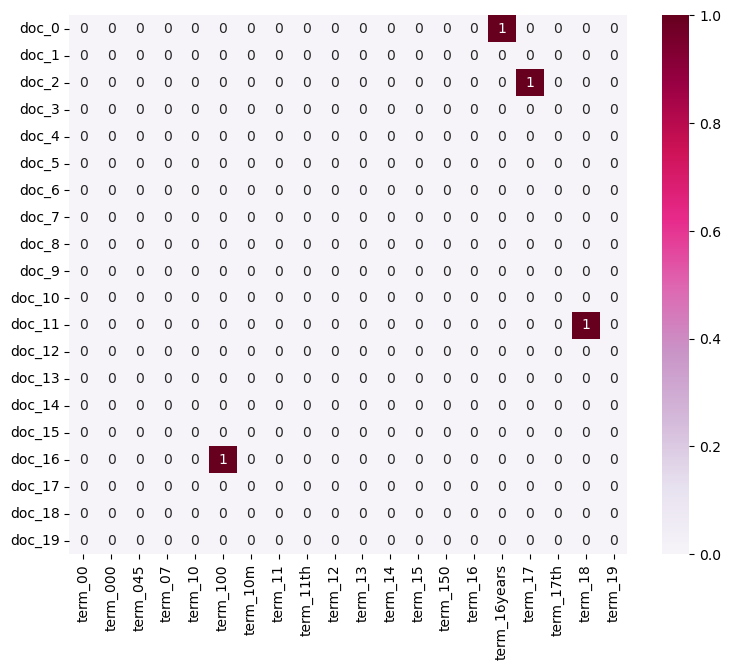

In [166]:
# first twenty features only

plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]

# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]

plot_z = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]

import seaborn as sns

# plot heat map
df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

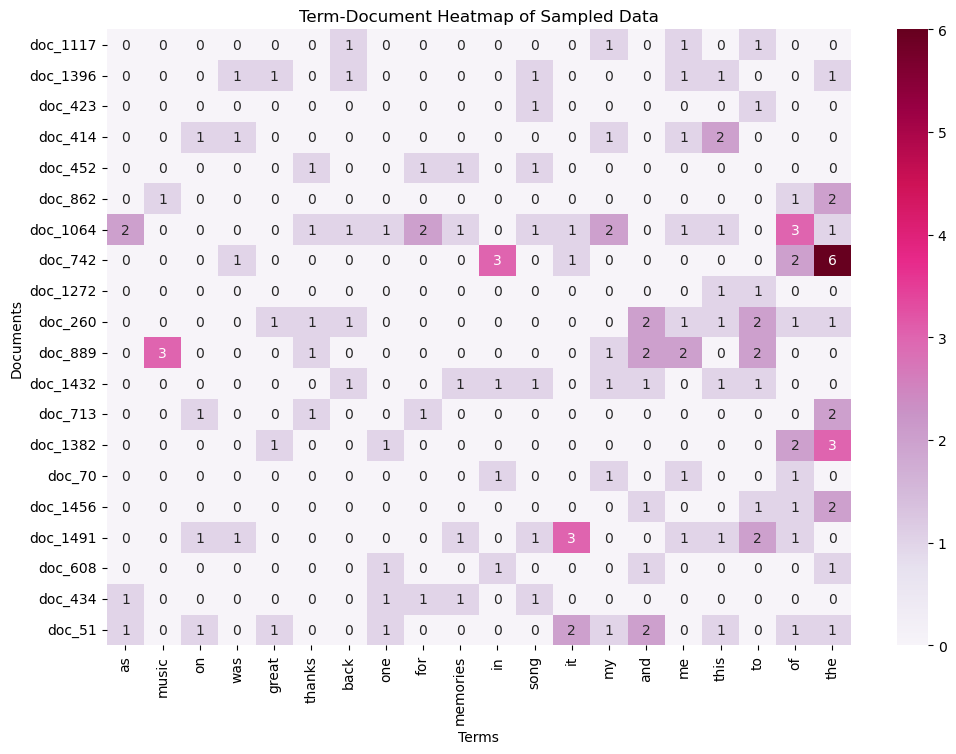

In [167]:
# Visualize the frequency of the top 20 most frequent terms across the 20 randomly sampled documents.

# Sample 20 random documents
sample_docs = X.sample(n=20, random_state=42)
X_counts_sampled = X_counts[sample_docs.index, :]

# Sum up the frequencies of each term
term_sums = X_counts_sampled.sum(axis=0).A1  # Convert to 1D array
top_n_terms = np.argsort(term_sums)[-20:]  # Get indices of top 20 terms

# Create a new DataFrame for the heatmap
plot_x = count_vect.get_feature_names_out()[top_n_terms]
plot_y = ["doc_" + str(i) for i in sample_docs.index]
plot_z = X_counts_sampled[:, top_n_terms].toarray()
df_todraw = pd.DataFrame(plot_z, columns=plot_x, index=plot_y)

# Plot the heatmap
plt.subplots(figsize=(12, 8))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=df_todraw.values.max(), annot=True)
plt.title("Term-Document Heatmap of Sampled Data")
plt.xlabel("Terms")
plt.ylabel("Documents")
plt.show()

### 5.4 Attribute Transformation / Aggregation

In [169]:
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))


In [170]:
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [171]:
term_index = count_vect.vocabulary_.get('music')
term_frequencies[term_index] #sum of term: 'music'

267

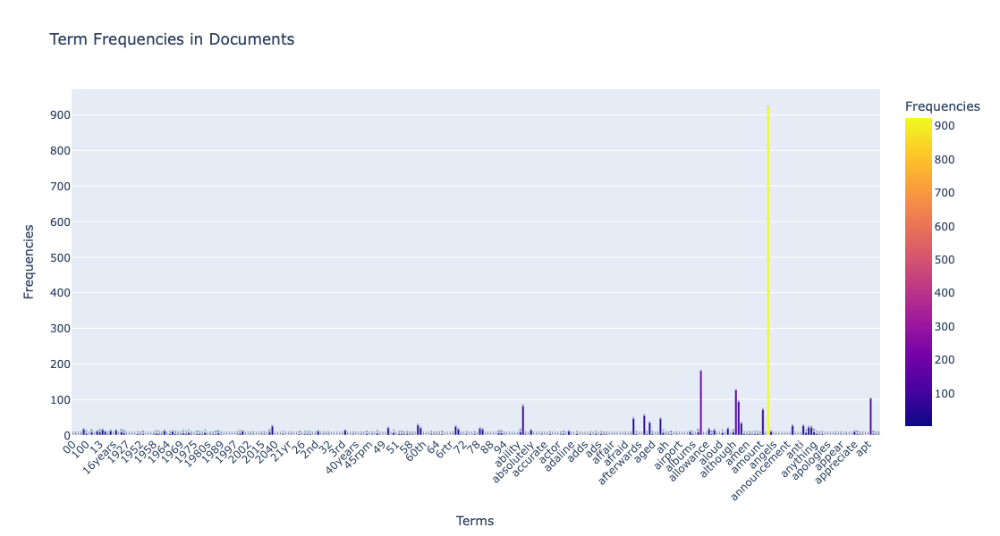

In [172]:
# generate a simple distribution of the words found in all the entire set of comments

# Answer here
import plotly.express as px

# Data
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
terms = count_vect.get_feature_names_out()[:300]  # Get the first 300 terms
frequencies = term_frequencies[:300]  # Corresponding frequencies

# Create a DataFrame for Plotly
df_frequencies = pd.DataFrame({
    'Terms': terms,
    'Frequencies': frequencies
})

# Plot Bar
fig = px.bar(df_frequencies, 
             x='Terms', 
             y='Frequencies', 
             title='Term Frequencies in Documents',
             labels={'Terms': 'Terms', 'Frequencies': 'Frequencies'},
             color='Frequencies', 
             hover_data=['Terms'],  
             text='Frequencies')  

# Format
fig.update_layout(xaxis_tickangle=-45,  
                  height=600,  
                  showlegend=False) 

# Show the figure
fig.show() 

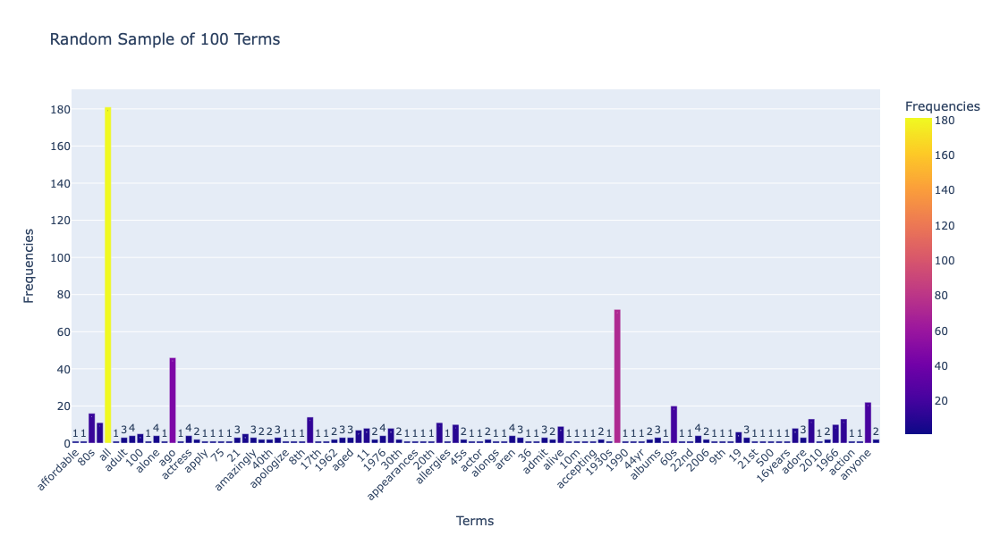

In [173]:
# Efficiently reduced plot (sorted by alphabet)

import pandas as pd
import numpy as np
import plotly.express as px

sample_size = 100  

# Randomly sample 
df_sample = df_frequencies.sample(n=sample_size, random_state=42)  # Random state for reproducibility

# Plot bar
fig_sample = px.bar(df_sample,
                    x='Terms',
                    y='Frequencies',
                    title=f'Random Sample of {sample_size} Terms',
                    labels={'Terms': 'Terms', 'Frequencies': 'Frequencies'},
                    color='Frequencies',
                    hover_data=['Terms'],
                    text='Frequencies')

# Format
fig_sample.update_layout(xaxis_tickangle=-45,
                         height=600,
                         showlegend=False)

# Show the figure
fig_sample.show()

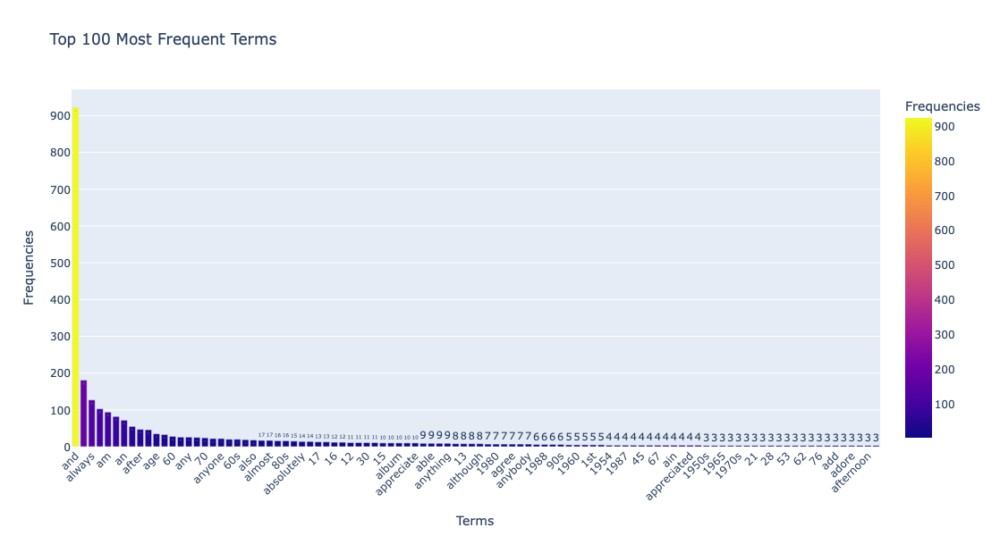

In [174]:
# sort the terms on the x-axis by frequency

# Set the number of top terms to visualize
top_n = 100  # Only include the top 100 terms

# Sort the DataFrame by frequency and select the top N
df_frequencies_top = df_frequencies.nlargest(top_n, 'Frequencies')

# Plot the top N terms
fig_top = px.bar(df_frequencies_top,
                 x='Terms',
                 y='Frequencies',
                 title=f'Top {top_n} Most Frequent Terms',
                 labels={'Terms': 'Terms', 'Frequencies': 'Frequencies'},
                 color='Frequencies',
                 hover_data=['Terms'],
                 text='Frequencies')

# Format
fig_top.update_layout(xaxis_tickangle=-45,
                      height=600,
                      showlegend=False)

# Show the figure
fig_top.show()

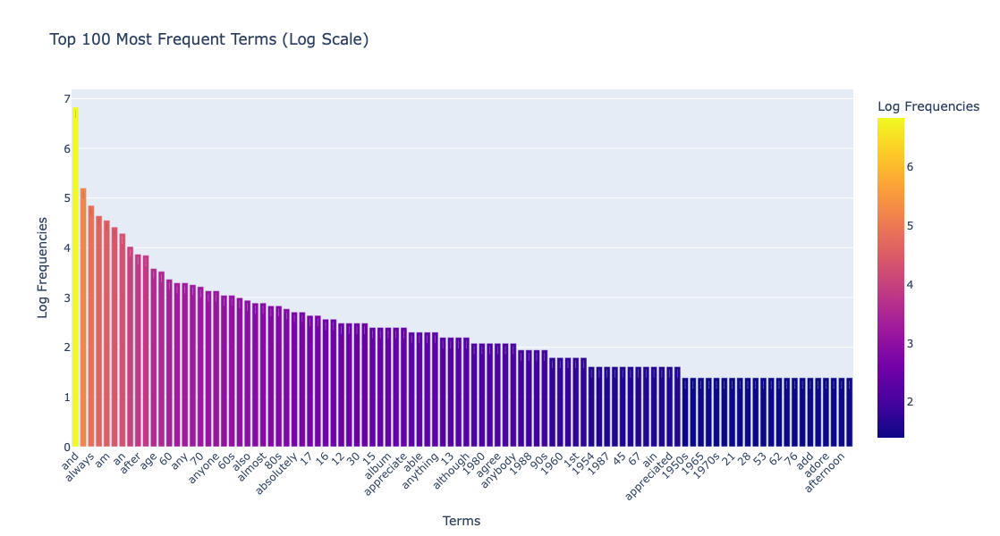

In [175]:
# transform the values into the log distribution for better readable visualizations

import numpy as np
import pandas as pd
import plotly.express as px

# Log-transform the term frequencies
term_frequencies_log = np.log1p(term_frequencies[:300])  # Log-transformed frequencies

# Create a DataFrame for Plotly with logarithmic frequencies
df_frequencies_log = pd.DataFrame({
    'Terms': terms,
    'Frequencies': term_frequencies_log  # Use log-transformed frequencies
})

# Set the number of top terms to visualize
top_n = 100  # Only include the top 100 terms

# Sort the DataFrame by frequency and select the top N
df_frequencies_log_top = df_frequencies_log.nlargest(top_n, 'Frequencies')

# Plot the top N terms using logarithmic frequencies
fig_log = px.bar(df_frequencies_log_top,
                 x='Terms',
                 y='Frequencies',
                 title=f'Top {top_n} Most Frequent Terms (Log Scale)',
                 labels={'Terms': 'Terms', 'Frequencies': 'Log Frequencies'},
                 color='Frequencies',
                 hover_data=['Terms'],
                 text='Frequencies')

# Format
fig_log.update_layout(xaxis_tickangle=-45,
                      height=600,
                      showlegend=False)

# Show the figure
fig_log.show()

###  Finding frequent patterns

In [177]:
# Define a function to assign category labels
def assign_label(sentiment):
    if sentiment == 'nostalgia':
        return 1  # Label for nostalgia
    else:
        return 2  # Label for not nostalgia

# Create a new column 'category_label' based on sentiment
X['category_label'] = X['sentiment'].apply(assign_label)

In [178]:
X

,comment,sentiment,unigrams,category_label
0,He was a singer with a golden voice that I lov...,not nostalgia,"[He, was, a, singer, with, a, golden, voice, t...",2
1,The mist beautiful voice ever I listened to hi...,nostalgia,"[The, mist, beautiful, voice, ever, I, listene...",1
2,I have most of Mr. Reeves songs. Always love ...,nostalgia,"[I, have, most, of, Mr., Reeves, songs, ., Alw...",1
3,30 day leave from 1st tour in Viet Nam to conv...,not nostalgia,"[30, day, leave, from, 1st, tour, in, Viet, Na...",2
4,listening to his songs reminds me of my mum wh...,nostalgia,"[listening, to, his, songs, reminds, me, of, m...",1
...,...,...,...,...
1495,"i don't know!..but the opening of the video,.....",not nostalgia,"[i, do, n't, know, !, .., but, the, opening, o...",2
1496,it's sad this is such a beautiful song when yo...,not nostalgia,"[it, 's, sad, this, is, such, a, beautiful, so...",2
1497,"Dear Friend, I think age and time is not that ...",not nostalgia,"[Dear, Friend, ,, I, think, age, and, time, is...",2
1498,I was born in 1954 and started to be aware of ...,nostalgia,"[I, was, born, in, 1954, and, started, to, be,...",1


In [179]:
# mine patterns that can be representative to each sentiment category
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['sentiment'].unique()  # Get unique sentiment labels
category_dfs = {}  # Dictionary to store DataFrames for each sentiment category

for sentiment in categories:
    # Filter the original DataFrame by category
    category_dfs[sentiment] = X[X['sentiment'] == sentiment].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['comment'])  # Transform the comment data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each sentiment category

for category_label in categories:
    filt_term_document_dfs[category_label] = create_term_document_df(category_dfs[category_label])

In [180]:
# Display the filtered DataFrame for one of the categories
category_number=0 #or 1
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


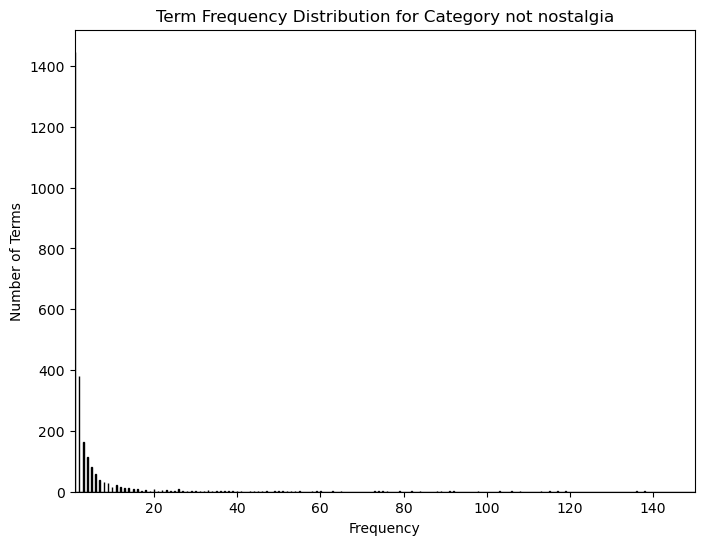

In [181]:
 # Sum over all documents to get total frequency for each word
category_number=0 
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(8, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 150)
plt.show()

When we're trying to find patterns in text data, we focus on combinations of words that are most helpful for classifying the documents. However, very rare words or extremely common words (like stopwords: 'the,' 'in,' 'a,' 'of,' etc.) don’t usually give us much useful information. 

To improve our results, we can filter out these words. Specifically, we'll remove the bottom 1% of the least frequent words and the top 5% of the most frequent ones. This helps us focus on words that might reveal more valuable patterns.

Thus, we will apply the filtering of words based on frequency thresholds (bottom 1% and top 5%).

Explore the frequencies of the **top 5%** words:

In [184]:
category_number=0 
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'on', 'what', 'not', 'be', 'can', 'me', 'voice', 'just', 'as', 'beautiful', 'songs', 'her', 'time', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'now', 'never', 'much', 'about', 'who', 'really', 'if', 'we', 'more', 'best', 'ever', 'by', 'thank', 'think', 'would', 'only', 'how', 'don', 'still', 'has', 'very', 'there', 'am', 'out', 'him', 'these', 'could', 'up', 'old', 'hear', 'do', 'listen', 'an', 'singer', 'had', 'many', 'here', 'such', 'version', 'too', 'today', 'been', 'most', 'get', 'your', 'people', 'world', 'heard', 'man', 'video', 'some', 'sing', 'listening', 'real', 'years', 'were', 'than', 'singing', 'heart', 'nice', 'their', 'better', 'life', 'day', 'its', 'then', 'way', 'sad', 'those',

In [185]:
sorted_counts #We can see the frequencies sorted in a descending order

array([708, 452, 451, ...,   1,   1,   1])

In [186]:
sorted_indices #This are the indices corresponding to the words after being sorted in a descending order

array([2276, 2290,  160, ..., 1509, 1510,    0])

In [187]:
filt_term_document_dfs[categories[category_number]].loc[:,'the'].sum(axis=0) #Here we can sum up the column corresponding to the top 5% words, we just specify which one first.

708

Explore the frequencies of the **bottom 1%** words:

In [189]:
category_number=0
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['00', 'montgomery', 'money', 'monday', 'moments', 'mocking', 'mock', 'mitch', 'misunderstood', 'minute', 'minds', 'miller', 'monumental', 'millennium', 'miles', 'microphone', 'miami', 'meta', 'mess', 'merle', 'mendes', 'mended', 'melting', 'melt', 'melodica', 'milestone']


In [190]:
sorted_counts #We can see the frequencies sorted in an ascending order

array([  1,   1,   1, ..., 451, 452, 708])

In [191]:
sorted_indices #This are the indices corresponding to the words after being sorted in an ascending order

array([   0, 1510, 1509, ...,  160, 2290, 2276])

In [192]:
filt_term_document_dfs[categories[category_number]].loc[:,'money'].sum(axis=0) #Here we can sum up the column corresponding to the bottom 1% words, we just specify which one first.

1

In [193]:
# filter them out of the dataframe
category_number=0 

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]



For category not nostalgia we filter the following words:
Bottom 1.0% words: 
00               1
montgomery       1
money            1
monday           1
moments          1
mocking          1
mock             1
mitch            1
misunderstood    1
minute           1
minds            1
miller           1
monumental       1
millennium       1
miles            1
microphone       1
miami            1
meta             1
mess             1
merle            1
mendes           1
mended           1
melting          1
melt             1
melodica         1
milestone        1
dtype: int64
Top 5.0% words: 
got         23
amazing     23
first       23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64

For category nostalgia we filter the following words:
Bottom 1.0% words: 
yup            1
gospel         1
rose           1
round          1
rousing        1
goodness       1
routine        1
row         

,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Analysis
No Nostalgia:
Bottom 1.0% Words
1. The words appear to be a mix of common nouns and proper nouns (e.g., Montgomery, Miller, Miami).
2. Many of these words seem to represent specific objects, names, or events but are used infrequently in the comments, indicating they might refer to niche or less relatable topics.
3. The presence of words like money and mock suggests a focus on more pragmatic or critical perspectives.

Top 5.0% Words
1. The top words are very common, including stopwords (e.g., the, and, to), which are often removed in text analysis due to their lack of specific meaning.
2. The presence of functional words suggests that the comments in this category might be more straightforward or objective, potentially reflecting a lack of depth in emotional expression.
3. Some frequent words like wish and amazing indicate a potential positivity, but their high frequency suggests they are used as fillers rather than deeply meaningful terms.


Nostalgia:
Bottom 1.0% Words
1. The words here seem to convey a broader range of emotions and themes, often with a nostalgic or reflective quality (e.g., goodness, ruined).
2. There are also some terms that evoke personal experiences or memories, such as sadder, saddest, and grace, indicating a deeper emotional connection to the past.
3. Many words could imply a sense of longing or appreciation for experiences, reinforcing the sentimental aspect of nostalgia.

Top 5.0% Words
1. The words here are more emotive and descriptive, implying a sense of appreciation and affection (e.g., wonderful, singing).
2. The use of terms like makes and makes indicates a focus on personal experiences, suggesting that the comments evoke fond memories and positive reflections.
3. The absence of common stopwords in the top filtered words reflects a more expressive and rich vocabulary related to memories and feelings.


---

# Frequent pattern mining process

In [197]:
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)


We will analyze the statistics of our newly created transactional databases by focusing on several key metrics:

1. **Database Size**: Total count of transactions within the dataset.
   
2. **Number of Items**: Count of unique items available across all transactions.

3. **Minimum Transaction Size**: The smallest number of items present in any transaction, indicating the simplest transaction.

4. **Average Transaction Size**: The mean number of items per transaction, reflecting the typical complexity of transactions.

5. **Maximum Transaction Size**: The largest number of items in any transaction, representing the most complex scenario.

6. **Standard Deviation of Transaction Size**: This measures the variability in transaction sizes; a higher value indicates greater diversity in transaction compositions.

7. **Variance in Transaction Sizes**: The square of the standard deviation, providing a broader perspective on the spread of transaction sizes.

8. **Sparsity**: This indicates the proportion of possible item combinations that do not occur. Values close to 1 suggest a high level of missing combinations.

In addition, we will create the following graphs:

- **Item Frequency Distribution**: 
  - **Y-axis**: Frequency (number of transactions an item appears in).
  - **X-axis**: Items ranked by their frequency.

- **Transaction Length Distribution**:
  - **Y-axis**: Frequency (occurrence of transaction lengths).
  - **X-axis**: Transaction length (number of items per transaction).

These analyses will help us understand the characteristics and patterns present in our transactional database.

Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.693460490463215
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.213372063492091
Variance in Transaction Sizes : 52.10372252435774
Sparsity : 0.9959733855996001


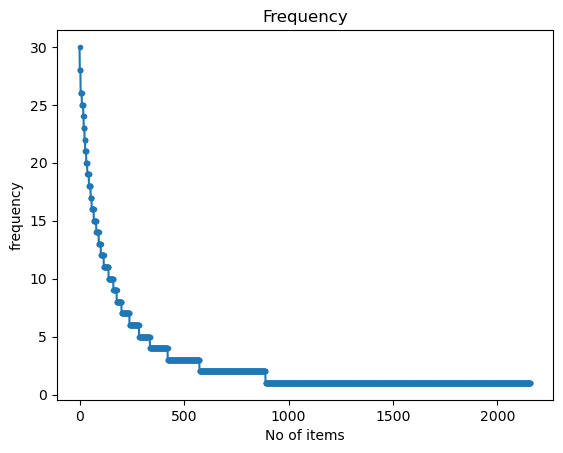

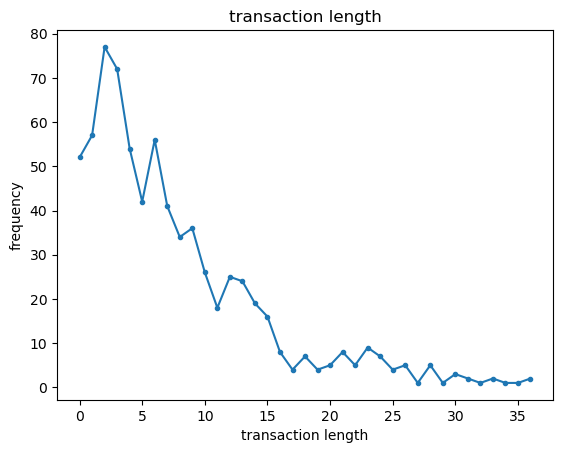

In [199]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 745
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.410738255033557
Maximum Transaction Size : 46
Standard Deviation Transaction Size : 5.926429722323316
Variance in Transaction Sizes : 35.16977700801039
Sparsity : 0.9965614316210002


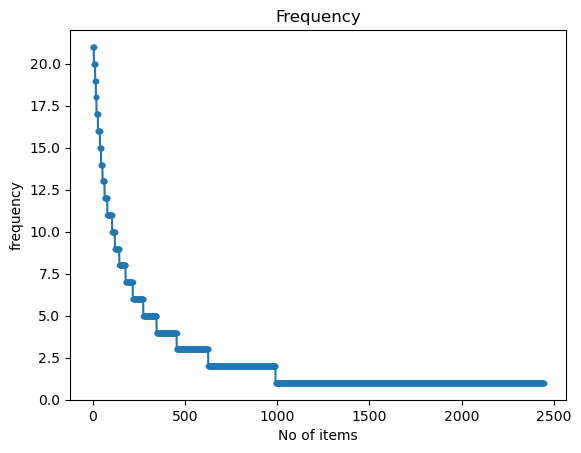

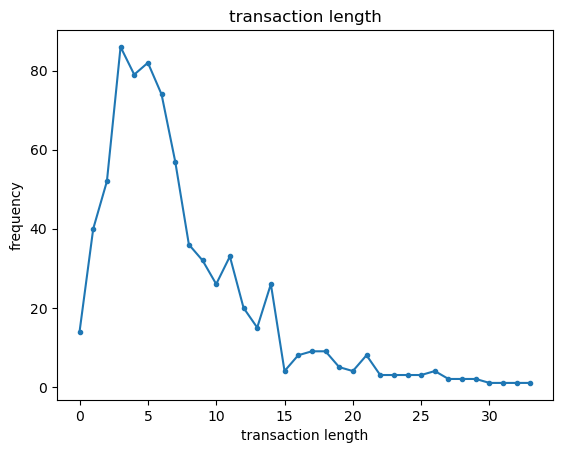

In [200]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_not nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

The statistics we gathered are crucial for setting the *minimum support* (minSup) threshold when using the FPGrowth algorithm from PAMI to mine patterns in our dataset. We have chosen a minSup of 9 based on two key observations:

1. **Item Frequency**: Most items in the dataset appear infrequently, with a significant drop-off in their occurrence. This indicates that there are many items that are seldom used.

2. **Transaction Length**: The majority of transactions consist of a small number of items, confirming that items do not typically group together frequently.

By setting minSup at 9, we aim to capture meaningful item combinations that appear in these common, smaller transactions. This threshold strikes a balance—it's low enough to include items that occur several times but high enough to exclude patterns that lack significance. This approach ensures our results remain clear and that the patterns we identify truly reflect the underlying dynamics of the dataset.

In [202]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.005546092987060547


In [203]:
obj1.save('freq_patterns_nostalgia_minSup9.txt') #save the patterns
frequentPatternsDF_nostalgia

,Patterns,Support
0,find,9
1,down,9
2,few,9
3,its,9
4,sure,9
...,...,...
175,ever,28
176,would,28
177,will,28
178,go,28


In [204]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_not_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.00449681282043457


In [205]:
obj1.save('freq_patterns_not_nostalgia_minSup9.txt') #save the patterns
frequentPatternsDF_not_nostalgia

,Patterns,Support
0,favorites,9
1,special,9
2,soul,9
3,mind,9
4,60,9
...,...,...
139,every,21
140,loved,21
141,classic,21
142,them,21


Having extracted the transactional patterns from our databases, the next step is to integrate them with our initial data for further analysis. We will focus on **unique patterns** specific to each category, filtering out any patterns common across multiple categories.

Focusing on unique patterns is crucial as they can **significantly enhance the classification process**. Distinctive patterns provide clear, category-specific signals that assist our model in accurately determining a document's category. This strategy ensures that the patterns we employ improve the model's ability to differentiate between various types of content effectively.

In [207]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_nostalgia, frequentPatternsDF_not_nostalgia]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

     Patterns  Support
127      will       28
126     would       28
125      ever       28
123        or       26
120       kid       26
..        ...      ...
142  handsome        9
143   perfect        9
144        ll        9
145     happy        9
0         its        9

[220 rows x 2 columns]
Number of patterns discarded: 104


There is a significant number of patterns that were common across different categories, which is why we chose to discard them. The next step is to integrate these now category-specific patterns into our data.

In [209]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'comment' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['comment'])  # X['comment'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Implement FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze 'not nostalgia' category in our processed database. For the FAE Top-K, run trials with k values of 300, 600, and 900, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

In [211]:
# FAE Top-K
from PAMI.frequentPattern.topk import FAE as alg
import pandas as pd

# Parameters
inputFile = 'td_freq_db_not nostalgia.csv'
separator = '\t'
k_values = [300, 600, 900]

# Initialize a DataFrame to store the results of the FAE algorithm
result_fae = pd.DataFrame(columns=['algorithm', 'k', 'patterns', 'runtime', 'memory'])

# Specify the algorithm name
algorithm = 'FAE'
for k in k_values:
    obj = alg.FAE(inputFile, k=k, sep=separator)
    obj.mine()
    # Store the results in the DataFrame
    result_fae.loc[result_fae.shape[0]] = [algorithm, k, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]

print("\nFAE Top-K Results:")
print(result_fae)

 TopK frequent patterns were successfully generated using FAE algorithm.
 TopK frequent patterns were successfully generated using FAE algorithm.
 TopK frequent patterns were successfully generated using FAE algorithm.

FAE Top-K Results:
  algorithm    k  patterns   runtime     memory
0       FAE  300       300  0.019049  964509696
1       FAE  600       600  0.049617  956088320
2       FAE  900       900  0.168022  906510336


- As the value of k increases, the number of patterns extracted increases. 
- The runtime also increases, indicating the increased computational complexity with larger k values.
- The patterns generated are capped at the k value, ensuring that exactly the number of patterns requested is returned.

In [213]:
# MaxFPGrowth
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg
import pandas as pd

#Specify the input parameters
inputFile = 'td_freq_db_not nostalgia.csv'
seperator='\t'
min_supports = [3, 6, 9]

#initialize a data frame to store the results of MaxFPGrowth algorithm
result = pd.DataFrame(columns=['algorithm', 'minSup', 'patterns', 'runtime', 'memory'])

for min_sup in min_supports:
    obj = alg.MaxFPGrowth(inputFile, minSup=min_sup, sep=seperator)
    obj.mine()
    #store the results in the data frame
    result.loc[result.shape[0]] = ['MaxFPGrowth', min_sup, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]
    
print("\nMaxFPGrowth Results:")
print(result)

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 

MaxFPGrowth Results:
     algorithm  minSup  patterns   runtime     memory
0  MaxFPGrowth       3       592  0.011829  907378688
1  MaxFPGrowth       6       271  0.005280  907411456
2  MaxFPGrowth       9       144  0.003649  907411456


- As the minSup increases, fewer patterns are extracted, and the runtime decreases accordingly. This makes sense because fewer combinations meet the higher support threshold.
- Memory usage remains fairly consistent across different minSup values, which suggests that the algorithm is efficiently handling memory regardless of how many patterns are found.

Similarities:
1. As either the k value (in FAE) or the minSup value (in MaxFPGrowth and FPGrowth) increases, the number of patterns extracted increases. This behavior is consistent across all algorithms.
2. Runtime also increases as the number of patterns requested/extracted grows, regardless of the algorithm.
3. All three algorithms exhibit similar levels of memory usage, with slightly decreasing memory usage as more patterns are extracted. This is due to the way frequent patterns are stored and processed as the algorithms proceed.
4. At minSup = 9, both MaxFPGrowth and FPGrowth generated exactly 144 patterns, showing that they extract identical results for the same minimum support threshold. This suggests that the core functionality of finding frequent patterns based on minimum support is shared.

Differences:
1. FAE Top-K: Runtime Increases with k. FAE’s runtime scales significantly with larger k values (e.g., 0.016 seconds for k=300, 0.049 seconds for k=600, and 0.178 seconds for k=900). This is because it must mine more patterns and ensure the top k are returned.
2. MaxFPGrowth: Consistent Performance with minSup. MaxFPGrowth is efficient, with runtime decreasing as minSup increases. For example, the runtime was 0.0118 seconds at minSup=3, 0.0054 seconds at minSup=6, and 0.0039 seconds at minSup=9. The algorithm also showed consistent memory usage regardless of minSup values, highlighting its efficiency in handling different support levels.
3. FPGrowth: Slightly Slower than MaxFPGrowth: While the pattern counts at minSup=9 were the same as MaxFPGrowth (144 patterns), FPGrowth’s runtime was slightly longer (0.0045 seconds vs. 0.0039 seconds). However, this difference is minimal and likely related to the algorithm’s handling of non-maximal patterns.


---

### 5.5 Dimensionality Reduction

Create a 2D plot after applying these algorithms to our dataframes.

In [219]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

In [220]:
X_pca_tdm.shape

(1499, 2)

In [221]:
X_tsne_tdm.shape

(1499, 2)

In [222]:
X_umap_tdm.shape

(1499, 2)

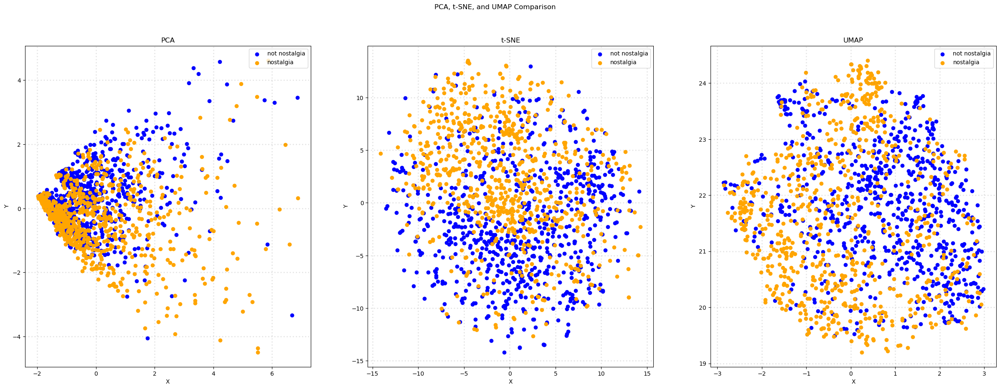

In [223]:
# Plot the results in subplots
col = ['blue', 'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

### Observations
- PCA: There is a clear clustering of the two classes (“nostalgia” and “not nostalgia”), but the separation is not very distinct. The classes overlap heavily on the left, indicating that PCA has limited capacity to fully distinguish them using linear projections.
- t-SNE: The separation between the two classes is less clear in the t-SNE plot. There is a significant mix between the blue and orange points, suggesting that t-SNE, while capturing more local structures, does not effectively differentiate between these classes based on document-term frequencies alone.
- UMAP: Similar to t-SNE, UMAP reveals a scattered distribution with many overlaps between the classes. It does, however, show more compact regions within each class compared to t-SNE, implying that UMAP might preserve more of the global structure.

In [225]:
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

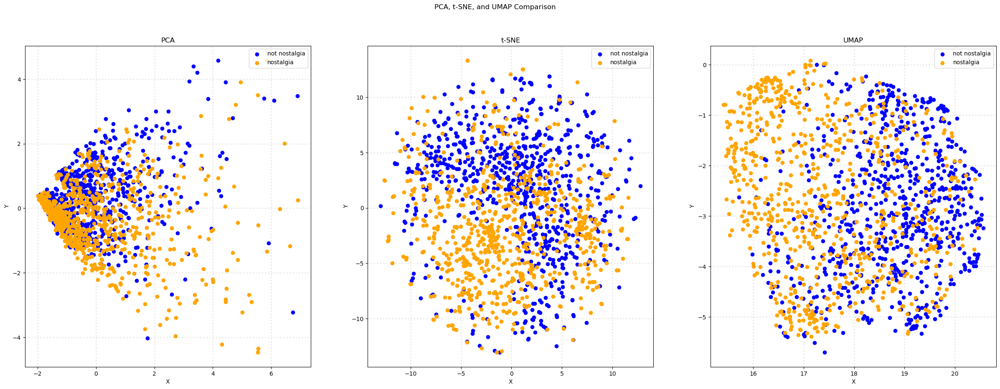

In [226]:
# Plot the results in subplots
col = ['blue', 'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

Due to the addition of **pattern-derived data** alongside the document-term frequency data, the augmentation changes the structure of the underlying data, which can significantly impact how the algorithms cluster the points in the lower-dimensional space.

### Key Differences:
1. Data Complexity:
- Previously, the dimensionality reduction was applied solely to the document-term frequency data, which primarily reflects how often terms appear in the documents. However, now the augmented dataset includes both document-term frequency and **pattern-derived data**, adding new features that may highlight patterns not captured by term frequency alone. This makes the data more complex, offering more information for the algorithms to work with.
  
2. PCA:
- The clustering improves slightly compared to the 1st graph. Although there is still overlap, the separation between “nostalgia” and “not nostalgia” is more noticeable, especially on the left. The additional data seem to provide better insights, helping PCA make more informed linear projections.
  
3. t-SNE:
- The 2nd graph shows a noticeable improvement in t-SNE’s ability to differentiate between the two classes. The points are more distinctly separated, and while some overlap remains, the added pattern-derived data helps t-SNE capture class boundaries more effectively.

4. UMAP:
- Similar to t-SNE, UMAP shows much clearer clustering in the second graph. The classes are more separated, and the internal structure of each class is better defined. The added data helps UMAP group the points more accurately.

### Conclusion:
- Inclusion of **pattern-derived data** has clearly enhanced all three techniques as it show improved separation between the “nostalgia” and “not nostalgia” classes
- The 2nd graph shows more distinct clusters for each class, particularly in UMAP and t-SNE, suggesting that the additional pattern-derived data is helpful for capturing more meaningful patterns
- While overlap between classes persists in both graphs, the 2nd graph reduces this overlap, showing that pattern-derived features are essential for improving the performance of these dimensionality reduction methods

In general, the augmented data appears to provide richer information, benefiting dimensionality reduction methods more significantly.

---
### 3D Plot
Reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

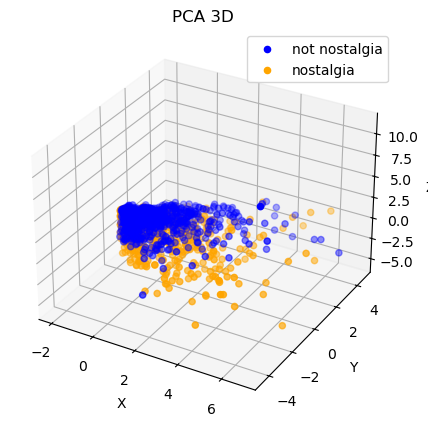

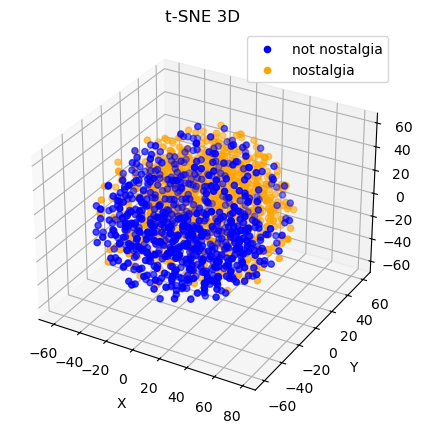

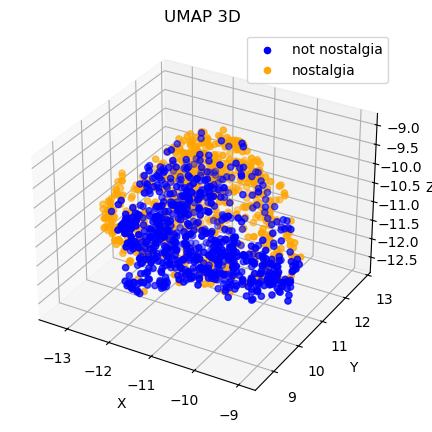

In [229]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Applying dimensionality reduction to 3D
X_pca_tdm_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_3d = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

# Define colors and categories
col = ['blue', 'orange']
categories = X['sentiment'].unique() 

# Function to create 3D scatter plot
def plot_3d_scatter(X_reduced, title): 
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category][:, 0]
        ys = X_reduced[X['sentiment'] == category][:, 1]
        zs = X_reduced[X['sentiment'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    plt.show()

# Create 3D scatter plots
plot_3d_scatter(X_pca_tdm_3d, 'PCA 3D')
plot_3d_scatter(X_tsne_tdm_3d, 't-SNE 3D')
plot_3d_scatter(X_umap_tdm_3d, 'UMAP 3D')

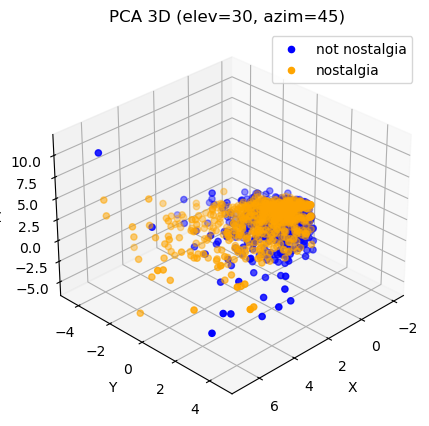

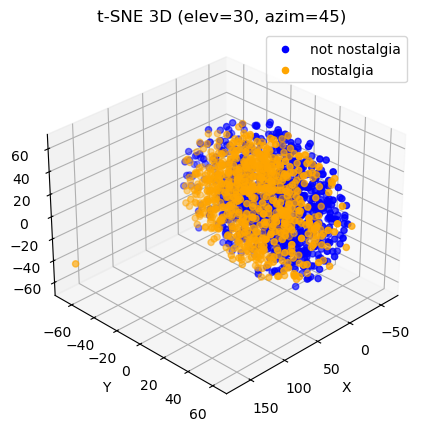

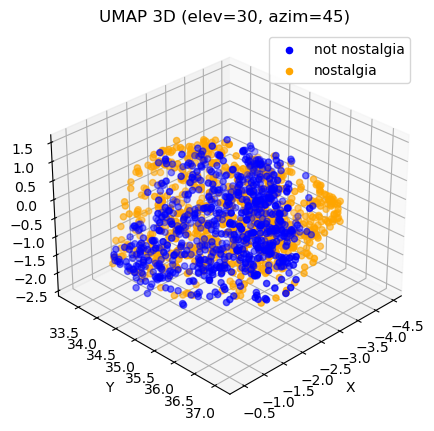

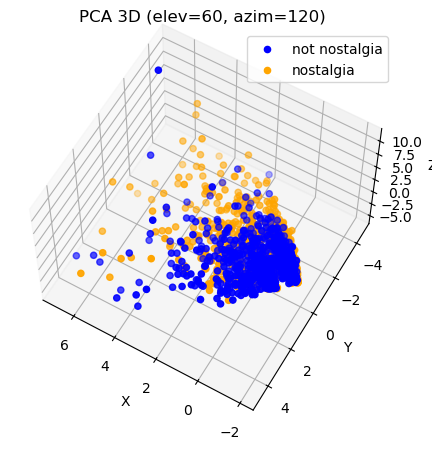

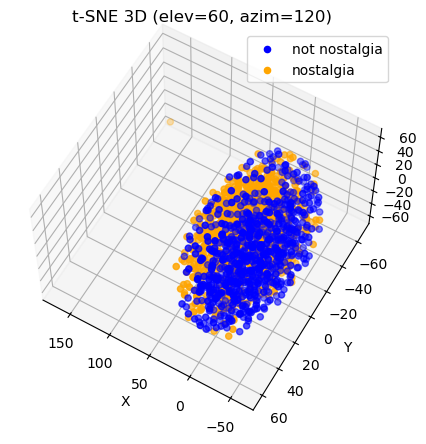

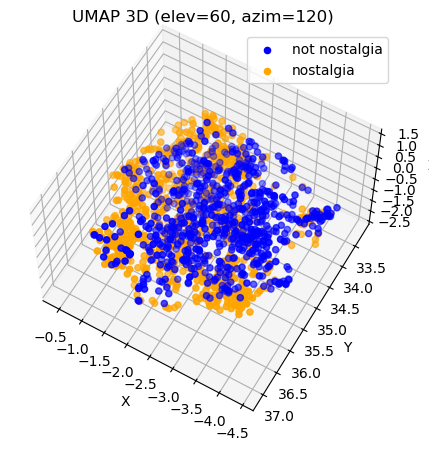

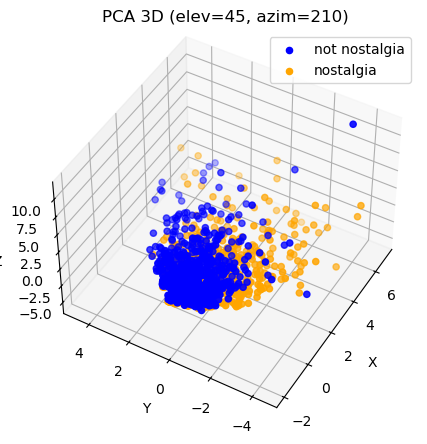

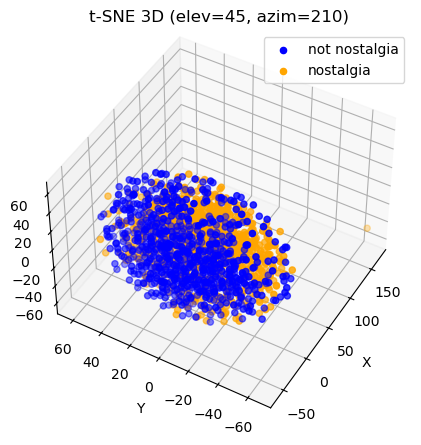

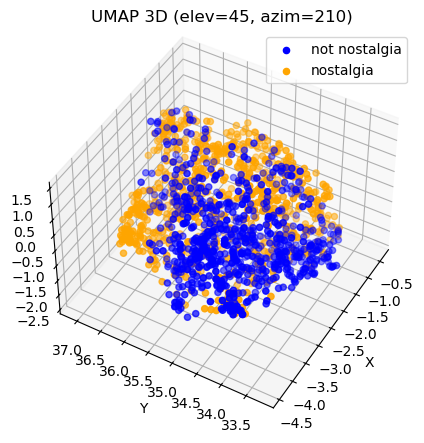

In [230]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Applying dimensionality reduction to 3D
X_pca_tdm_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_3d = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

# Define colors and categories
col = ['blue', 'orange']
categories = X['sentiment'].unique() 

# Function to create 3D scatter plot with adjustable camera angle
def plot_3d_scatter(X_reduced, title, elev=30, azim=45): 
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category][:, 0]
        ys = X_reduced[X['sentiment'] == category][:, 1]
        zs = X_reduced[X['sentiment'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    
    # Adjust camera angle
    ax.view_init(elev=elev, azim=azim)
    
    plt.show()

# Create 3D scatter plots from different angles
angles = [(30, 45), (60, 120), (45, 210)]  # Different viewing angles (elev, azim)

for elev, azim in angles:
    plot_3d_scatter(X_pca_tdm_3d, f'PCA 3D (elev={elev}, azim={azim})', elev=elev, azim=azim)
    plot_3d_scatter(X_tsne_tdm_3d, f't-SNE 3D (elev={elev}, azim={azim})', elev=elev, azim=azim)
    plot_3d_scatter(X_umap_tdm_3d, f'UMAP 3D (elev={elev}, azim={azim})', elev=elev, azim=azim)

3D scatter plots of PCA, t-SNE, UMAP:
1. PCA:
- In both 2D and 3D plots, there is heavy overlap, especially on the left side in the 2D view and along the negative axis in 3D.
- 3D plot shows significant overlap between the two classes, “nostalgia” and “not nostalgia” Both classes are cluttered mainly in the same region, with most points clustered around the negative Y-axis.
- 3D plot mainly reaffirms that PCA is not well-suited to differentiate between these classes based on document-term data.

3. t-SNE:
- The 3D t-SNE plot builds upon the 2D plot by spreading the points across a larger space, with axes ranging from -60 to 60.
- While the third dimension provides more room for subtle data distinctions, the overlap between “nostalgia” and “not nostalgia” is still apparent. The points are densely packed, and there is significant intermixing between the two classes, indicating that the additional dimension does not drastically improve the separation.
- While it captures the local structure, the high degree of overlap between classes suggests that the underlying document-term frequencies do not offer enough distinctive features for t-SNE to separate the classes clearly.
  
3. UMAP:
- 3D plot introduces a more structured and clearer separation between “nostalgia” and “not nostalgia.” While there is still some overlap, the classes appear more compact and better defined in 3D compared to the other methods.
- 2D UMAP plot already suggested better class separation compared to t-SNE, but in 3D, this distinction becomes even more pronounced.
- The 3rd dimension helps further differentiate the classes, with clearer boundaries emerging. The compact clustering of points in 3D within x axis -17 to -21 as compared to the more scattered t-SNE in 3D, further proves that UMAP shows a more interpretable and organized distinction between the classes in 3D compared to the other methods.

From both 2D and 3D plots, we can conclude that **UMAP** offers the best class separation, with more structured and compact clusters, while **PCA** and **t-SNE** show significant overlap and struggle to distinguish the "nostalgia" and "not nostalgia" classes effectively. The 3D view reinforces that UMAP preserves both local and global structures better than the other two methods.

---

### 5.6 Discretization and Binarization
Important pre-preprocessing technique used to transform the data, specifically categorical values, into a format that satisfies certain criteria required by particular algorithms

In [234]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [235]:
mlb = preprocessing.LabelBinarizer()

In [236]:
mlb.fit(X.category_label)

LabelBinarizer()

In [237]:
X['bin_sentiment'] = mlb.transform(X['sentiment']).tolist()

In [238]:
X[0:9]

,comment,sentiment,unigrams,category_label,tokenized_text,bin_sentiment
0,He was a singer with a golden voice that I lov...,not nostalgia,"[He, was, a, singer, with, a, golden, voice, t...",2,"{at, now., those, now,, relaxed,, still, to, i...",[0]
1,The mist beautiful voice ever I listened to hi...,nostalgia,"[The, mist, beautiful, voice, ever, I, listene...",1,"{an, still, beautiful, to, was, angel, him, of...",[0]
2,I have most of Mr. Reeves songs. Always love ...,nostalgia,"[I, have, most, of, Mr., Reeves, songs, ., Alw...",1,"{at, town, no, Mr., but, to, great, was, gentl...",[0]
3,30 day leave from 1st tour in Viet Nam to conv...,not nostalgia,"[30, day, leave, from, 1st, tour, in, Viet, Na...",2,"{Nam, are, from, 30, to, in, Viet, later, pray...",[0]
4,listening to his songs reminds me of my mum wh...,nostalgia,"[listening, to, his, songs, reminds, me, of, m...",1,"{my, reminds, played, mum, to, me, listening, ...",[0]
5,"Every time I heard this song as a child, I use...",nostalgia,"[Every, time, I, heard, this, song, as, a, chi...",1,"{used, still, to, me, Reeves,, heard, cry....b...",[0]
6,"My dad loved listening to Jim Reeves, when I w...",nostalgia,"[My, dad, loved, listening, to, Jim, Reeves, ,...",1,"{dad, do, but, things., to, in, Reeves,, was, ...",[0]
7,i HAVE ALSO LISTENED TO Jim Reeves since child...,nostalgia,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...",1,"{childhood, to, in, he, me, i, Jim, and, HAVE,...",[0]
8,Wherever you are you always in my heart,not nostalgia,"[Wherever, you, are, you, always, in, my, heart]",2,"{my, are, heart, in, always, you, Wherever}",[0]


The new attribute, `bin_sentiment`, is either 0's and 1's. It is different from the master data as for the homework, X has only two unique values (e.g., “nostalgia” and “not nostalgia”), thus the output from the MultiLabelBinarizer will only contain binary indicators for these two labels. If you are transforming an instance that belongs to “nostalgia,” you will only see [1] if there’s a presence indicator for that sentiment.

In [240]:
# generate the binarization using the category_label column 
X['bin_category_label'] = mlb.transform(X['category_label']).tolist()
X[0:9]

,comment,sentiment,unigrams,category_label,tokenized_text,bin_sentiment,bin_category_label
0,He was a singer with a golden voice that I lov...,not nostalgia,"[He, was, a, singer, with, a, golden, voice, t...",2,"{at, now., those, now,, relaxed,, still, to, i...",[0],[1]
1,The mist beautiful voice ever I listened to hi...,nostalgia,"[The, mist, beautiful, voice, ever, I, listene...",1,"{an, still, beautiful, to, was, angel, him, of...",[0],[0]
2,I have most of Mr. Reeves songs. Always love ...,nostalgia,"[I, have, most, of, Mr., Reeves, songs, ., Alw...",1,"{at, town, no, Mr., but, to, great, was, gentl...",[0],[0]
3,30 day leave from 1st tour in Viet Nam to conv...,not nostalgia,"[30, day, leave, from, 1st, tour, in, Viet, Na...",2,"{Nam, are, from, 30, to, in, Viet, later, pray...",[0],[1]
4,listening to his songs reminds me of my mum wh...,nostalgia,"[listening, to, his, songs, reminds, me, of, m...",1,"{my, reminds, played, mum, to, me, listening, ...",[0],[0]
5,"Every time I heard this song as a child, I use...",nostalgia,"[Every, time, I, heard, this, song, as, a, chi...",1,"{used, still, to, me, Reeves,, heard, cry....b...",[0],[0]
6,"My dad loved listening to Jim Reeves, when I w...",nostalgia,"[My, dad, loved, listening, to, Jim, Reeves, ,...",1,"{dad, do, but, things., to, in, Reeves,, was, ...",[0],[0]
7,i HAVE ALSO LISTENED TO Jim Reeves since child...,nostalgia,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...",1,"{childhood, to, in, he, me, i, Jim, and, HAVE,...",[0],[0]
8,Wherever you are you always in my heart,not nostalgia,"[Wherever, you, are, you, always, in, my, heart]",2,"{my, are, heart, in, always, you, Wherever}",[0],[1]


---

# 6. Data Exploration

In [243]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = X.iloc[10]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = X.iloc[20]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = X.iloc[30]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

In [244]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['ill bet if they begin to play this song on the radio to a new generation it could be still a hit ,,that goes for anytime in the future']
["So many happy memories of the Jim reeves album from my childhood can drift away listening to him now I'm 44yr old"]
['remembering the good old days']


In [245]:
from sklearn.preprocessing import binarize

count_vect = CountVectorizer()
count_vect.fit(X['comment'])

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [246]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.156772
Cosine Similarity using count bw 1 and 3: 0.160644
Cosine Similarity using count bw 2 and 3: 0.195180
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


/var/folders/q5/zb81tr195bxf2y44g71tycq80000gq/T/ipykernel_25417/452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/q5/zb81tr195bxf2y44g71tycq80000gq/T/ipykernel_25417/452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/q5/zb81tr195bxf2y44g71tycq80000gq/T/ipykernel_25417/452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/q5/zb81tr195bxf2y44g71tycq80000gq/T/ipykernel_25417/452772485.py:17: Dep

As expected, cosine similarity between a sentence and itself is 1. Between 2 entirely different sentences, it will be 0. 

We can assume that we have the more common features in the documents 2 and 3 than in documents 1 and 2. This reflects indeed in a higher similarity than that of sentences 2 and 3. 


---
# Instruction #3 
Generate meaningful new data visualizations. Refer to online resources and the Data Mining textbook for inspiration and ideas.

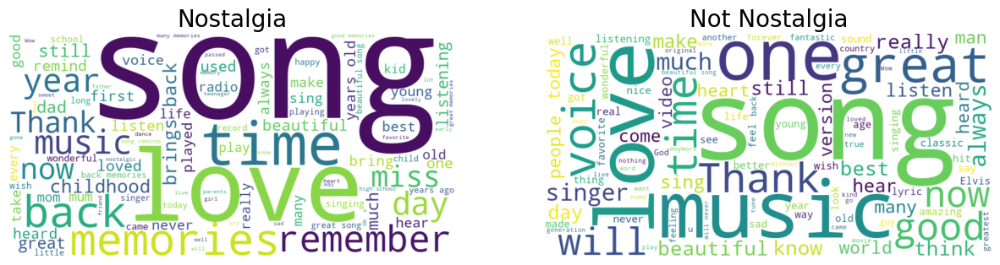

In [249]:
# Word cloud for Sentiment Classes
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Separate text by sentiment
nostalgia_text = " ".join(X[X['sentiment'] == 'nostalgia']['comment'].values)
not_nostalgia_text = " ".join(X[X['sentiment'] == 'not nostalgia']['comment'].values)

# Generate word clouds
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
wordcloud1 = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(nostalgia_text)
wordcloud2 = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(not_nostalgia_text)

# Plot the word clouds
axes[0].imshow(wordcloud1, interpolation='bilinear')
axes[0].set_title('Nostalgia', fontsize=20)
axes[0].axis('off')

axes[1].imshow(wordcloud2, interpolation='bilinear')
axes[1].set_title('Not Nostalgia', fontsize=20)
axes[1].axis('off')

plt.show()

- Nostalgia: Words such as “time,” “memories,” “remember,” “back,” and “childhood” are prevalent in nostalgic comments. These terms evoke feelings of reminiscence and personal reflection, suggesting a connection to past experiences and cherished moments.
- Not Nostalgia: In contrast, words like “great,” “music,” “good,” and “singer” dominate comments categorized as not nostalgic. These terms focus more on the appreciation of music and artists in the present context, emphasizing enjoyment and quality rather than personal memory.
---

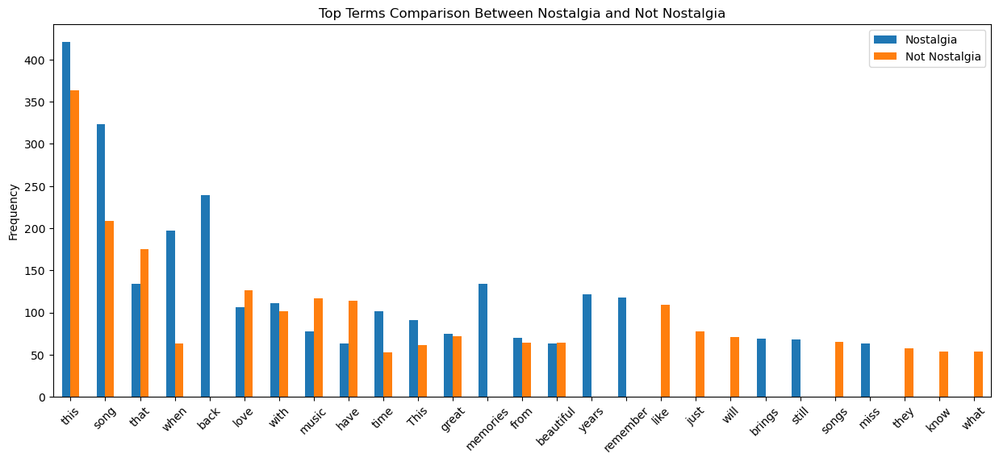

In [251]:
# Bar graph for Top 20 words in each Sentiment Classes

import pandas as pd
import matplotlib.pyplot as plt

# Separate counts for each sentiment
nostalgia_counts = X[X['sentiment'] == 'nostalgia']['comment'].str.split(expand=True).stack().value_counts()
not_nostalgia_counts = X[X['sentiment'] == 'not nostalgia']['comment'].str.split(expand=True).stack().value_counts()

# Filter to keep only words longer than 3 letters
# Words with 3 letters or below are usually commonly used filler words (eg: the, me), thus might not be significant
nostalgia_counts = nostalgia_counts[nostalgia_counts.index.str.len() > 3]
not_nostalgia_counts = not_nostalgia_counts[not_nostalgia_counts.index.str.len() > 3]

# Select top 20 terms for both classes
top_nostalgia = nostalgia_counts.head(20)
top_not_nostalgia = not_nostalgia_counts.head(20)

# Combine into a DataFrame
df_terms_comparison = pd.DataFrame({
    'Nostalgia': top_nostalgia,
    'Not Nostalgia': top_not_nostalgia
}).fillna(0)

# Sort DataFrame by total counts from largest to smallest
df_terms_comparison['Total'] = df_terms_comparison['Nostalgia'] + df_terms_comparison['Not Nostalgia']
df_terms_comparison = df_terms_comparison.sort_values(by='Total', ascending=False).drop(columns='Total')

# Plot the comparison
df_terms_comparison.plot(kind='bar', figsize=(15, 6), title="Top Terms Comparison Between Nostalgia and Not Nostalgia")
plt.xticks(rotation=45)
plt.ylabel("Frequency")
plt.show()

- Nostalgia: In the top 20 nostalgic comments, words such as “years,” “memories,” “back,” and “remember” are prominently featured only in this category. These terms reflect a deep sense of reminiscence and connection to past experiences, underscoring the emotional weight of nostalgia.
- Not Nostalgia: Conversely, the top 20 comments categorized as not nostalgic prominently include words like “like,” “just,” and “will”, which only appeared as top 20 in 'Not Nostalgia'. These terms suggest a focus on present experiences and sentiments, emphasizing immediacy and appreciation rather than reflection on the past.
---

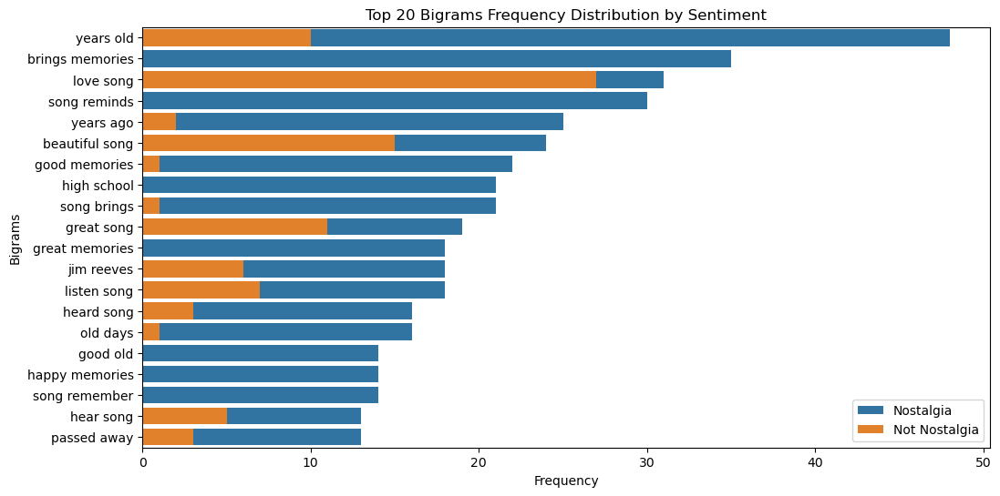

In [253]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer

# Create a function to get bigram frequencies for a given sentiment
def get_bigram_frequencies(X, sentiment):
    # Filter the DataFrame by sentiment
    filtered_comments = X[X['sentiment'] == sentiment]['comment']
    
    # Create a CountVectorizer for bigrams
    bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')
    X_bigrams = bigram_vectorizer.fit_transform(filtered_comments)
    
    # Sum up the occurrences of each bigram
    bigram_counts = X_bigrams.sum(axis=0).A1
    bigram_features = bigram_vectorizer.get_feature_names_out()
    
    # Create a DataFrame for bigram frequencies
    bigram_df = pd.DataFrame({'Bigram': bigram_features, 'Frequency': bigram_counts})
    
    return bigram_df

# Get bigram frequencies for both sentiments
nostalgia_bigrams = get_bigram_frequencies(X, 'nostalgia')
not_nostalgia_bigrams = get_bigram_frequencies(X, 'not nostalgia')

# Merge
bigram_combined = pd.merge(nostalgia_bigrams, not_nostalgia_bigrams, on='Bigram', how='outer', suffixes=('_nostalgia', '_not_nostalgia'))

# Get the top 20 for both sentiments
top_n_bigrams = bigram_combined.nlargest(20, 'Frequency_nostalgia')

# Plot Graph
plt.figure(figsize=(12, 6))
sns.barplot(x='Frequency_nostalgia', y='Bigram', data=top_n_bigrams, label='Nostalgia')
sns.barplot(x='Frequency_not_nostalgia', y='Bigram', data=top_n_bigrams, label='Not Nostalgia')

# Add titles and labels
plt.title("Top 20 Bigrams Frequency Distribution by Sentiment")
plt.xlabel("Frequency")
plt.ylabel("Bigrams")
plt.legend()
plt.show()

- Dominance of Nostalgia Bigrams: Most bigrams, such as “years old,” “brings memories,” “song reminds,” “years ago,” and “beautiful song,” show a higher frequency in the “Nostalgia” category, with very little presence in “Not Nostalgia.”
- Nostalgia: Words like “love song,” “good memories,” “high school,” and “old days” are strongly associated with nostalgic sentiment, indicating a clear trend towards recalling past experiences.
- Not Nostalgia: Some bigrams, like “love song” and “song brings,” show moderate representation in the “Not Nostalgia” category, though they are still largely dominated by nostalgic sentiment.
- Sentiment Overlap: In bigrams like “heard song” and “listen song,” the distribution is more balanced, suggesting that these phrases can be associated with both nostalgic and non-nostalgic sentiments.
---

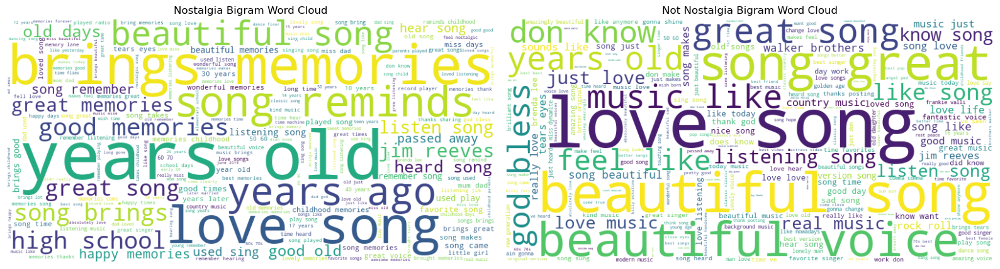

In [255]:
from wordcloud import WordCloud

# Generate a word cloud for nostalgia bigrams
nostalgia_bigram_freq_dict = dict(zip(nostalgia_bigrams['Bigram'], nostalgia_bigrams['Frequency']))
nostalgia_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(nostalgia_bigram_freq_dict)

# Generate a word cloud for not nostalgia bigrams
not_nostalgia_bigram_freq_dict = dict(zip(not_nostalgia_bigrams['Bigram'], not_nostalgia_bigrams['Frequency']))
not_nostalgia_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(not_nostalgia_bigram_freq_dict)

# Display the word clouds side by side
plt.figure(figsize=(16, 8))

# Nostalgia Word Cloud
plt.subplot(1, 2, 1)
plt.imshow(nostalgia_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Nostalgia Bigram Word Cloud")

# Not Nostalgia Word Cloud
plt.subplot(1, 2, 2)
plt.imshow(not_nostalgia_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Not Nostalgia Bigram Word Cloud")

plt.tight_layout()
plt.show()

Nostalgia:
- The largest and most frequent bigrams are strongly associated with memories, such as “brings memories,” “years old,” and “song reminds.”
- Significant presence of phrases like “good old,” “childhood memories,” “high school,” and “miss days,” which point to nostalgia for specific life stages and events.
- Music plays a central role in nostalgia, with phrases like “beautiful song,” “heard song,” “listen song,” and artist names like “Jim Reeves” and “Brenda Lee” being prevalent.
- Phrases like “happy memories” and “great memories” also suggest a largely positive sentiment associated with remembering the past.

Not Nostalgia:
- The largest bigrams in this word cloud include “beautiful song,” “love song,” “great song,” and “song like.” These indicate a focus on musical appreciation but without the same depth of reflection on memories.
- There is a clear focus on descriptions of music and artists, with phrases like “beautiful voice,” “great music,” and “song makes,” which highlight the aesthetic appreciation of songs rather than emotional recollection.
- Unlike the Nostalgia cloud, there are fewer references to time periods or life stages. While words like “years old” still appear, they are much smaller in comparison, indicating they are less prominent in non-nostalgic discussions.
- Words like “voice,” “feel,” and “know” suggest a more present or direct experience with music, focusing on the qualities of the song or artist rather than memory or reflection.

---

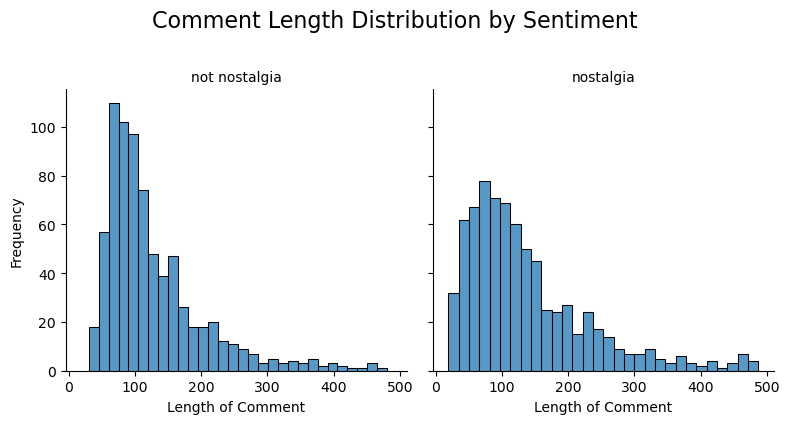

In [258]:
# Histogram of comment lengths distribution by sentiment
import seaborn as sns
import matplotlib.pyplot as plt

X['comment_length'] = X['comment'].apply(len)

# Create a FacetGrid for the histogram of comment lengths by sentiment
g = sns.FacetGrid(X, col='sentiment', height=4, aspect=1)
g.map(sns.histplot, 'comment_length', bins=30)
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Length of Comment", "Frequency")

# Set the title and adjust its position
g.fig.suptitle("Comment Length Distribution by Sentiment", fontsize=16, y=1.05)  # Adjust y to move title up

# Adjust the layout to prevent overlap
plt.subplots_adjust(top=0.85)  # Adjust the top margin

# Show the plot
plt.show()

- For “not nostalgia” comments, the majority of the lengths cluster between 50 and 150 characters, with a sharp decline in frequency as the comment length increases.
- For “nostalgia” comments, there is also a concentration around the 50–150 character range, but there are more instances of longer comments, extending beyond 200 and even up to 500 characters.

In conclusion, comments expressing nostalgia are more likely to be longer than those that do not, indicating that nostalgic sentiment may evoke more detailed or elaborate expressions.

---

# 7. Data Classification

# Instruction #3 
* Generate TF-IDF features from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn guide .

Using TF-IDF gives more weight to words that are important in distinguishing categories. This is especially useful in cases like sentiment analysis, where some words (e.g., “nostalgic”, “memories”, “past”) may be more unique to one category and less frequent in the other.

In [422]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Convert 'comment' column into TF-IDF matrix using TfidfVectorizer
tfidf_vect = TfidfVectorizer()
X_tfidf = tfidf_vect.fit_transform(X['comment'])  # Replace CountVectorizer with TfidfVectorizer
terms = tfidf_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['comment'].str.split().apply(set)

# Convert the TF-IDF matrix to a DataFrame for easy merging
tfidf_df = pd.DataFrame(X_tfidf.toarray(), columns=terms, index=X.index)
tfidf_df

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [424]:
# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Concatenate the original TF-IDF matrix and the pattern matrix to augment the features
augmented_tfidf = pd.concat([tfidf_df, pattern_matrix], axis=1)

# Final augmented DataFrame
augmented_tfidf

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


---

# Instruction #3 
**Naive Bayes classifier** 
* Implement a simple Naive Bayes classifier that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences. Refer to this article.

In [426]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

#Create a mapping from numerical labels to category names
category_mapping = dict(X[['category_label', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

In [428]:
# Word Frequency Features 

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, X['category_label'], test_size=0.3, random_state=42)

# MultinomialNB Classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8222    0.9528    0.8827       233
not nostalgia     0.9389    0.7788    0.8514       217

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



In [430]:
# TF-IDF Features with Bernoulli NB
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

# Split the data into training and testing sets (70% train, 30% test)
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(tfidf_df, X['category_label'], test_size=0.3, random_state=42)

# TF-IDF Features
nb_classifier = BernoulliNB()
nb_classifier.fit(X_train_tfidf, y_train_tfidf)

# Make predictions on the test set
y_pred_tfidf = nb_classifier.predict(X_test_tfidf)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test_tfidf, y_pred_tfidf))
print("\nClassification Report:\n", classification_report(y_test_tfidf, y_pred_tfidf, target_names=target_names, digits=4))

Accuracy: 0.8844444444444445

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8521    0.9399    0.8939       233
not nostalgia     0.9275    0.8249    0.8732       217

     accuracy                         0.8844       450
    macro avg     0.8898    0.8824    0.8835       450
 weighted avg     0.8885    0.8844    0.8839       450



In [400]:
# TF-IDF Features with Multinomial NB
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train_tfidf, y_train_tfidf)

# Make predictions on the test set
y_pred_tfidf = nb_classifier.predict(X_test_tfidf)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test_tfidf, y_pred_tfidf))
print("\nClassification Report:\n", classification_report(y_test_tfidf, y_pred_tfidf, target_names=target_names, digits=4))

Accuracy: 0.8622222222222222

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8132    0.9528    0.8775       233
not nostalgia     0.9379    0.7650    0.8426       217

     accuracy                         0.8622       450
    macro avg     0.8755    0.8589    0.8601       450
 weighted avg     0.8733    0.8622    0.8607       450



Overall Accuracy:
- The TF-IDF Classifier with BernoulliNB outperforms the Word Frequency Classifier (MultinomialNB), achieving an accuracy of 88.4% compared to 86.8%. This shows that BernoulliNB is slightly better at classifying the test data when using TF-IDF features, which focus on the presence or absence of terms rather than raw frequency counts.

Recall :
- The most notable difference is in the recall for the “not nostalgia” category. The TF-IDF classifier’s recall (82.49%) is higher than the word frequency model (77.88%). This suggests that BernoulliNB with TF-IDF is more capable of identifying “not nostalgia” comments than the MultinomialNB word frequency model. This might be because BernoulliNB focuses more on whether a word is present, aligning well with the nature of TF-IDF, which gives more weight to rare but informative words.
 
F1-Score:
- The f1-scores are consistently higher for the TF-IDF classifier in both categories, meaning that it achieves a better balance between precision and recall than the word frequency classifier. This balance is especially important in text classification, where both over-predicting (high recall, low precision) and under-predicting (low recall, high precision) can be problematic.


Why BernoulliNB with TF-IDF Works Better:
- BernoulliNB focuses on word presence/absence: With TF-IDF, the focus shifts to the presence of key words (weighted by their informativeness), which aligns well with BernoulliNB’s binary treatment of features.
- On the other hand, MultinomialNB, which thrives on raw word counts, is slightly less suited for TF-IDF, where the emphasis is on rare but informative words. TF-IDF tends to smooth out extreme differences in word frequencies, making the presence of certain words (even if rare) more critical than their frequency.
- BernoulliNB works well with sparse datasets like TF-IDF, where many features are zero (eg, most words are absent from most documents). In contrast, MultinomialNB is designed to handle counts, which may not fully leverage the sparsity of TF-IDF data.
- It is also proven by that the accuracy of TF-IDF Features with Multinomial NB has a lower accuracy of 86.2% than that with BernoulliNB which has an accuracy of 88.4%. It is even lower than the Word Frequency Classifier (MultinomialNB) that has 86.4%.

Conclusion:
The TF-IDF classifier using BernoulliNB outperforms the word frequency classifier using MultinomialNB, especially in terms of accuracy and recall for the “not nostalgia” category. This is likely because TF-IDF emphasizes the presence of key words, which aligns well with BernoulliNB’s strength in dealing with binary-like data, whereas MultinomialNB is better suited for word frequency data where raw word counts matter more.

---
### Model with the augmented data

In [402]:
# Word Frequency Features 

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, X['category_label'], test_size=0.3, random_state=42)

# MultinomialNB Classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8644444444444445

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8185    0.9485    0.8787       233
not nostalgia     0.9333    0.7742    0.8463       217

     accuracy                         0.8644       450
    macro avg     0.8759    0.8613    0.8625       450
 weighted avg     0.8739    0.8644    0.8631       450



In [404]:
# TF-IDF Features

# Split the data into training and testing sets (70% train, 30% test)
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(augmented_tfidf, X['category_label'], test_size=0.3, random_state=42)

# TF-IDF Features
nb_classifier = BernoulliNB()
nb_classifier.fit(X_train_tfidf, y_train_tfidf)

# Make predictions on the test set
y_pred_tfidf = nb_classifier.predict(X_test_tfidf)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test_tfidf, y_pred_tfidf))
print("\nClassification Report:\n", classification_report(y_test_tfidf, y_pred_tfidf, target_names=target_names, digits=4))

Accuracy: 0.8866666666666667

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8611    0.9313    0.8948       233
not nostalgia     0.9192    0.8387    0.8771       217

     accuracy                         0.8867       450
    macro avg     0.8902    0.8850    0.8860       450
 weighted avg     0.8891    0.8867    0.8863       450



From the first model, the data already allows the model to classify it with great accuracy for both word frequency and TF-IDF, but if we add the additional information provided by the patterns then we see a slightly better result to an already high score. 

- Word Frequency's accuracy for first model increased from 86.8% to 86.4% in the second model.
- TF-IDF's accuracy for first model increased from 88.4% to 88.6% in the second model.

---

# Instruction #4 
* In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? This part is worth 10% of your grade.

1. Text Tokenization and Preprocessing
- Current Approach: Tokenizing sentences by splitting them using spaces without removing stopwords, punctuation, or handling different cases (e.g., lowercase/uppercase variations).
- Issue: This basic tokenization might leave unnecessary words (like “and”, “the”, “is”) in the dataset, leading to less meaningful patterns. Punctuation and case differences can also lead to redundant tokens.

Thus, to address the issue:
- Use more advanced tokenization: Consider using libraries like nltk or spaCy to tokenize sentences while removing stopwords, punctuation, and converting all text to lowercase. This would improve the consistency of tokens and remove irrelevant terms.
- Lemmatization/Stemming: Apply lemmatization or stemming to group similar words (e.g., “running” and “run”) together.

In [408]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re

nltk.download('stopwords')
nltk.download('wordnet')
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    # Remove punctuation and convert to lowercase
    text = re.sub(r'[^\w\s]', '', text.lower())
    # Tokenize, remove stopwords, and lemmatize
    tokens = [lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words]
    return " ".join(tokens)

X['cleaned_comment'] = X['comment'].apply(preprocess_text)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/amytan2/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/amytan2/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [410]:
X['comment']

0       He was a singer with a golden voice that I lov...
1       The mist beautiful voice ever I listened to hi...
2       I have most of Mr. Reeves songs.  Always love ...
3       30 day leave from 1st tour in Viet Nam to conv...
4       listening to his songs reminds me of my mum wh...
                              ...                        
1495    i don't know!..but the opening of the video,.....
1496    it's sad this is such a beautiful song when yo...
1497    Dear Friend, I think age and time is not that ...
1498    I was born in 1954 and started to be aware of ...
1499    This is the first CD I bought after my marriag...
Name: comment, Length: 1499, dtype: object

In [412]:
X['cleaned_comment']

0       singer golden voice love hear time great fan a...
1       mist beautiful voice ever listened kid still l...
2       mr reef song always love smooth voice comforti...
3       30 day leave 1st tour viet nam convince mary l...
4              listening song reminds mum played everyday
                              ...                        
1495    dont knowbut opening videoseeing himwould sugg...
1496    sad beautiful song love someone afraid tell re...
1497    dear friend think age time important come musi...
1498    born 1954 started aware popular music grandmot...
1499    first cd bought marriage ended divorce 28 year...
Name: cleaned_comment, Length: 1499, dtype: object

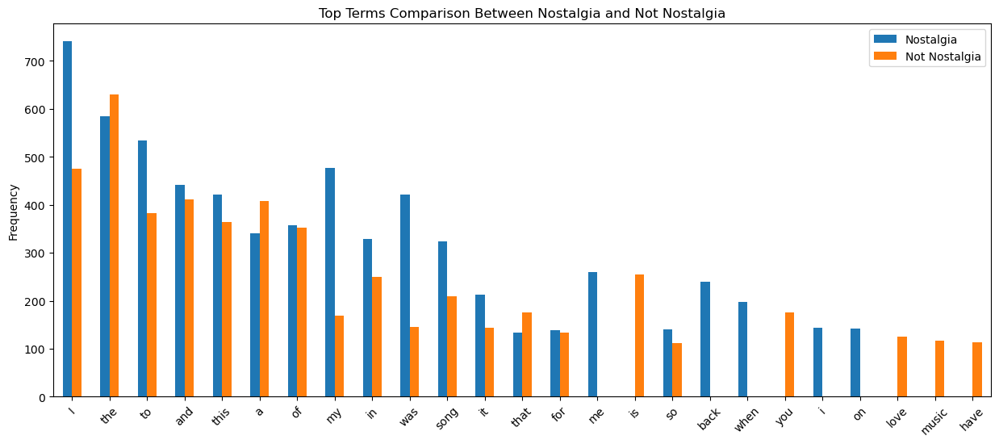

In [414]:
# Bar graph for Top 20 words in each Sentiment Classes (Uncleaned)

import pandas as pd
import matplotlib.pyplot as plt

# Separate counts for each sentiment
nostalgia_counts = X[X['sentiment'] == 'nostalgia']['comment'].str.split(expand=True).stack().value_counts()
not_nostalgia_counts = X[X['sentiment'] == 'not nostalgia']['comment'].str.split(expand=True).stack().value_counts()

# Select top 20 terms for both classes
top_nostalgia = nostalgia_counts.head(20)
top_not_nostalgia = not_nostalgia_counts.head(20)

# Combine into a DataFrame
df_terms_comparison = pd.DataFrame({
    'Nostalgia': top_nostalgia,
    'Not Nostalgia': top_not_nostalgia
}).fillna(0)

# Sort DataFrame by total counts from largest to smallest
df_terms_comparison['Total'] = df_terms_comparison['Nostalgia'] + df_terms_comparison['Not Nostalgia']
df_terms_comparison = df_terms_comparison.sort_values(by='Total', ascending=False).drop(columns='Total')

# Plot the comparison
df_terms_comparison.plot(kind='bar', figsize=(15, 6), title="Top Terms Comparison Between Nostalgia and Not Nostalgia")
plt.xticks(rotation=45)
plt.ylabel("Frequency")
plt.show()

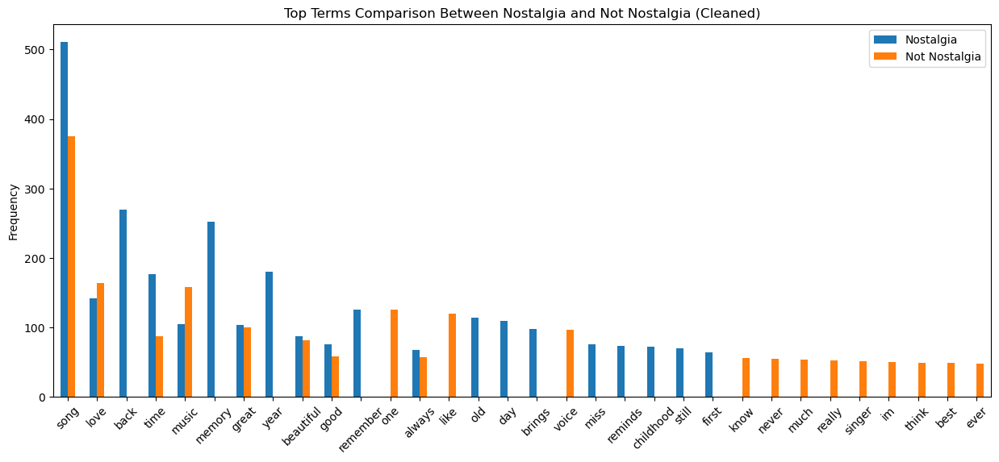

In [416]:
# Bar graph (Cleaned)

import pandas as pd
import matplotlib.pyplot as plt

# Separate counts for each sentiment
nostalgia_counts = X[X['sentiment'] == 'nostalgia']['cleaned_comment'].str.split(expand=True).stack().value_counts()
not_nostalgia_counts = X[X['sentiment'] == 'not nostalgia']['cleaned_comment'].str.split(expand=True).stack().value_counts()

# Select top 20 terms for both classes
top_nostalgia = nostalgia_counts.head(20)
top_not_nostalgia = not_nostalgia_counts.head(20)

# Combine into a DataFrame
df_terms_comparison = pd.DataFrame({
    'Nostalgia': top_nostalgia,
    'Not Nostalgia': top_not_nostalgia
}).fillna(0)

# Sort DataFrame by total counts from largest to smallest
df_terms_comparison['Total'] = df_terms_comparison['Nostalgia'] + df_terms_comparison['Not Nostalgia']
df_terms_comparison = df_terms_comparison.sort_values(by='Total', ascending=False).drop(columns='Total')

# Plot the comparison
df_terms_comparison.plot(kind='bar', figsize=(15, 6), title="Top Terms Comparison Between Nostalgia and Not Nostalgia (Cleaned)")
plt.xticks(rotation=45)
plt.ylabel("Frequency")
plt.show()

In the first graph, which represents the uncleaned data, we notice that many of the top 20 words include common filler words like “I”, “and”, “to”, and “this.” These are stopwords—frequent words that carry little meaning on their own and do not contribute much to distinguishing between different sentiment classes like nostalgia or not nostalgia. The presence of these words in the analysis adds noise and makes it difficult to interpret the true nature of the comments.

However, after cleaning the text data, which includes removing these filler words, lowercasing, and possibly lemmatizing the words, the second graph shows a much clearer and more meaningful picture. Words like “song”, “love”, and “time” emerge as frequent terms. These words are semantically rich and closely tied to emotions and memories, which are critical in identifying nostalgic sentiments. For example:

	•	“Song” or “love” could evoke memories of past relationships or favorite music.
	•	“Time” often refers to a past period, which is directly relevant to nostalgic reflections.

This improvement highlights how cleaning the data by removing stopwords and irrelevant terms helps us focus on the words that matter most for the sentiment classification task. It allows us to better understand the key themes driving sentiment, leading to more accurate & meaningful insights, improved model performance and efficiency.

---

2. TF-IDF without Data Cleaning

- Current Approach: The TF-IDF features are generated directly from the tokenized text without considering frequent words or infrequent words.
- Issue: This can result in sparse vectors with many unnecessary terms that don’t contribute much to understanding sentiment.

- To address the issue:
- Set thresholds for term frequency: While generating TF-IDF features, we can ignore terms that appear too frequently (like common words that are less informative across documents) or too infrequently (which may be noise).
- Adjust TF-IDF settings: Use parameters like min_df (to ignore terms that appear in too few documents) and max_df (to ignore terms that appear in too many documents).


In [452]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# Convert 'comment' column into TF-IDF matrix using TfidfVectorizer with fine-tuning
tfidf_vectorizer_fine_tuned = TfidfVectorizer(min_df=5, max_df=0.9, max_features=5000)
tfidf_matrix_fine_tuned = tfidf_vectorizer_fine_tuned.fit_transform(X['comment']) 
terms_fine_tuned = tfidf_vectorizer_fine_tuned.get_feature_names_out()  

# Tokenize the sentences into sets of unique words
X['tokenized_comments'] = X['comment'].str.split().apply(set)

# Convert the TF-IDF matrix to a DataFrame for easy merging
tfidf_df_fine_tuned = pd.DataFrame(tfidf_matrix_fine_tuned.toarray(), columns=terms_fine_tuned, index=X.index)

# Split the data into training and testing sets (70% train, 30% test)
X_train_fine_tuned, X_test_fine_tuned, y_train_fine_tuned, y_test_fine_tuned = train_test_split(tfidf_df_fine_tuned, X['category_label'], test_size=0.3, random_state=42)

# Train the Bernoulli Naive Bayes classifier
nb_classifier_fine_tuned = BernoulliNB()
nb_classifier_fine_tuned.fit(X_train_fine_tuned, y_train_fine_tuned)

# Make predictions on the test set
y_pred_fine_tuned = nb_classifier_fine_tuned.predict(X_test_fine_tuned)

# Evaluate the classifier
accuracy_fine_tuned = accuracy_score(y_test_fine_tuned, y_pred_fine_tuned)
report_fine_tuned = classification_report(y_test_fine_tuned, y_pred_fine_tuned, target_names=target_names, digits=4)

print("Fine-Tuned Model Accuracy:", accuracy_fine_tuned)
print("\nFine-Tuned Model Classification Report:\n", report_fine_tuned)

Fine-Tuned Model Accuracy: 0.8888888888888888

Fine-Tuned Model Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8704    0.9227    0.8958       233
not nostalgia     0.9113    0.8525    0.8810       217

     accuracy                         0.8889       450
    macro avg     0.8909    0.8876    0.8884       450
 weighted avg     0.8902    0.8889    0.8887       450



### Improvements from Fine-Tuning

- **Overall Accuracy**: 
  - **Original**: 88.44% 
  - **Fine-Tuned**: 88.89% 
  - **Improvement**: +0.45%


- **Nostalgia Class**:
  - **Precision**: Increased from **0.8521** to **0.8704** 
    - Improved ability to identify nostalgia comments accurately.
  - **F1-score**: Slightly improved from **0.8939** to **0.8958** 
    - Maintained balance between precision and recall.


- **Not Nostalgia Class**:
  - **Recall**: Improved from **0.8249** to **0.8525** 
    - Better at capturing not-nostalgia comments.
  - **F1-score**: Increased from **0.8732** to **0.8810** 
    - Enhanced overall performance in classification. The model is more effective at identifying true positives without generating too many false positives or false negatives.

The fine-tuning process led to improvements in accuracy, precision, and recall across both sentiment classes, indicating a more reliable and effective model for classifying nostalgia and not nostalgia comments.

### Conclusion

In summary, tokenizing the comments lays the groundwork for potential further feature engineering and analysis, enabling a more comprehensive understanding of the data, focusing on relevant words. Additionally, the implementation of fine-tuning the TF-IDF vectorization through the careful selection of parameters such as `min_df`, `max_df`, and `max_features` has successfully enhanced the model's efficiency and effectiveness in classifying comments related to nostalgia. By reducing the dimensionality of the feature set, the model can focus on the most relevant terms, leading to improved accuracy and performance metrics.

### Considerations for Future Enhancements

To further improve the model and its performance, several enhancements can be considered:
1. **Explore Other Feature Selection Techniques**:
   - Implement techniques such as Chi-Squared tests, Recursive Feature Elimination (RFE), or feature importance analysis to identify and retain only the most informative features. This can help in further streamlining the model and enhancing its predictive power.

2. **Experiment with Different Classifiers**:
   - Investigate alternative classification algorithms, such as Support Vector Machines (SVM), Random Forests, or Gradient Boosting, to determine if they provide better performance for this specific task. Each algorithm has unique strengths that may be better suited to the nuances of the data.

3. **Hyperparameter Tuning**:
   - Utilize techniques such as Grid Search or Random Search to optimize the hyperparameters of the chosen model, ensuring the best possible performance.

By considering these potential enhancements, we can continue to refine the accuracy and efficiency of our data and thus build a more reliable and accurate sentiment classification model.